In [70]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from matplotlib import pyplot as plt
import matplotlib
import cv2
import numpy as np
import pandas as pd
from collections import deque, namedtuple
from matplotlib import pyplot as plt, patches
import torch
from REACTRL import RealExpEnv, Episode_Memory, Createc_Controller, sac_agent, ReplayMemory, HerReplayMemory

from REACTRL import plot_graph, show_reset, show_done, show_step, image_detect_edges, image_detect_blobs, image_select_points, detect_indiv_mols, detect_indiv_mol_center
from REACTRL    import mol_property
from REACTRL.env_modules.rrt import RRT
from REACTRL.task_script.collect_images import save_scan_image, scan_all_approach_area, tip_form_region

matplotlib.rcParams['image.cmap'] = 'gray'
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)
from matplotlib import pyplot as plt, patches


from matplotlib.patches import Rectangle 


# Python code to demonstrate namedtuple()
from collections import namedtuple

import pickle
from scipy.spatial.distance import cdist
from REACTRL.env_modules.img_conv import *
from REACTRL.env_modules.net_framework import *

cpu


In [77]:
current_time

'6_15_22_20'

In [71]:
pixel_small=128
scan_len_nm_small=3.5
diss_maxtime=100
diss_radius_nm=1.0
diss_mvoltage=2000
diss_pcurrent=300
diss_z_nm=20
total_output_folder = 'all_output'
task_folder_prefix = 'vertmani'
save_scan_img_large_prefix = 'scan_img_large'
save_scan_img_before_prefix = 'scan_img_before'
save_scan_img_after_prefix = 'scan_img_after'
save_scan_data_large_prefix = 'scan_data_large'
save_scan_data_before_prefix = 'scan_data_before'
save_scan_data_after_prefix = 'scan_data_after'
save_vert_data_prefix = 'vert_data'
save_vert_tip_pos_prefix = 'vert_tip_pos'

# current_time = '4_1_22_45'

# current_time='4_2_10_53'
# current_time='4_2_14_27'

# current_time='4_2_15_40'
# current_time='4_2_18_6'

# current_time='4_2_18_58'
# current_time='4_3_12_58'

# current_time='4_4_21_51'

# current_time='4_10_22_57'

# current_time='4_13_14_41'

# current_time='4_15_14_13'
# current_time='4_17_16_1'

# current_time='4_19_19_44'
# current_time='4_25_14_15'
# current_time='5_2_15_5'

# current_time='5_5_22_33'

# current_time='5_6_15_16'
# current_time='5_7_11_55'

# current_time='5_8_12_30'

# current_time='5_10_20_7'

# current_time='5_16_14_31'

# current_time='5_17_17_7'

# current_time='5_19_19_3'
# current_time='5_20_11_4'

# current_time='5_26_10_51'     

# current_time='5_29_15_47'

# current_time='5_30_22_49'

#current_time='5_31_20_9'

# current_time='5_31_22_48'   # important pulse action 2 pos fixed

# current_time='6_1_14_57'

# current_time='6_1_21_8'

# current_time='6_3_13_39'

# current_time='6_8_17_21'


# current_time='6_11_8_24'

# current_time='6_15_22_20'

current_time='6_21_23_1'

task_folder='%s/%s_%s' % (total_output_folder, task_folder_prefix, current_time)
save_img_large='%s/%s_%s' % (task_folder, save_scan_img_large_prefix, current_time)
save_img_before='%s/%s_%s' % (task_folder, save_scan_img_before_prefix, current_time)
save_img_after='%s/%s_%s' % (task_folder, save_scan_img_after_prefix, current_time)
save_data_large='%s/%s_%s' % (task_folder, save_scan_data_large_prefix, current_time)
save_data_before='%s/%s_%s' % (task_folder, save_scan_data_before_prefix, current_time)
save_data_after='%s/%s_%s' % (task_folder, save_scan_data_after_prefix, current_time)
save_vert_data='%s/%s_%s' % (task_folder, save_vert_data_prefix, current_time)
save_vert_tip_pos='%s/%s_%s' % (task_folder, save_vert_tip_pos_prefix, current_time)

In [3]:
save_path='all_output/tip_form/tip_img_6_11_8_24/img_forward_-340.0_-48.70681953430176.png'
episode_i=0
diss_i=10
kkk=0
img_large=cv2.imread('%s/img_forward_%d_%d.png' % (save_path, episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
# img=cv2.imread('%s/img_forward_%d_%d_%d.png' % (save_path, episode_i, diss_i, kkk), cv2.IMREAD_GRAYSCALE)

In [142]:
# save_path='all_output/tip_form/tip_img_6_11_8_24/img_forward_-340.0_-48.70681953430176.png'
save_path='all_output/tip_form/tip_img_6_11_8_24/img_forward_340.0_-10.221492767333984.png'

img_large=cv2.imread(save_path, cv2.IMREAD_GRAYSCALE)


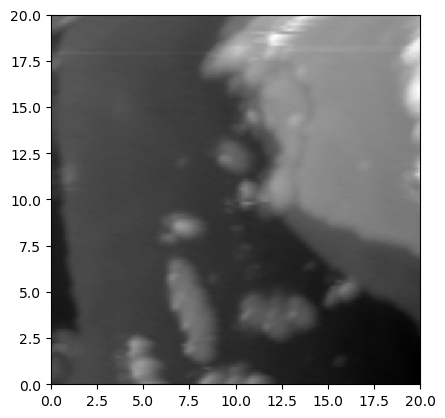

In [143]:
# plt.subplot(1,2,1)
plt.imshow(img_large, extent=(0,20,0,20))
# plt.xlim(0,20)
# plt.ylim(0,20)

In [144]:

gray = img_large

squareKern = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
light = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, squareKern)
light = cv2.threshold(light, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

In [145]:
abc=np.where(light>50)

In [146]:
abc=np.where(light>50)
abc_array=np.array([[abc[0][i], abc[1][i]] for i in range(len(abc[0]))])

In [63]:
np.column_stack(np.where(light > 0))

array([[  0,  83],
       [  0,  84],
       [  0,  85],
       ...,
       [127, 125],
       [127, 126],
       [127, 127]], dtype=int64)

[[71 28]] 12.529964086141668
[[111  85]] 7.280109889280518
[[62 38]] 8.94427190999916
[[76 68]] 11.0
[[126  23]] 4.123105625617661
[[61 42]] 9.0
[[30 23]] 25.238858928247925
[[10 49]] 6.4031242374328485
[[ 91 115]] 12.165525060596439
[[124   6]] 20.8806130178211
[[107  92]] 8.94427190999916
[[105  37]] 6.4031242374328485
[[73 21]] 18.439088914585774
[[63  5]] 7.0
[[75 29]] 10.198039027185569
[[112  42]] 4.47213595499958
[[114  41]] 5.0
[[119  86]] 15.297058540778355
[[66 39]] 5.0
[[97 81]] 6.324555320336759
[[ 4 38]] 18.867962264113206
[[114  12]] 14.317821063276353
[[105  59]] 6.0
[[115  71]] 7.615773105863909
[[91  8]] 29.0
[[38 36]] 24.596747752497688
[[65 52]] 7.211102550927978
[[126 105]] 30.265491900843113
[[ 98 105]] 4.242640687119285
[[92 53]] 5.0
[[123 105]] 27.294688127912362
[[35 47]] 16.55294535724685
[[21 40]] 13.152946437965905
[[27 10]] 13.45362404707371
[[91 90]] 10.44030650891055
[[82 26]] 13.92838827718412
[[39  5]] 17.0
[[64 18]] 14.422205101855956
[[54 16]] 10.19803

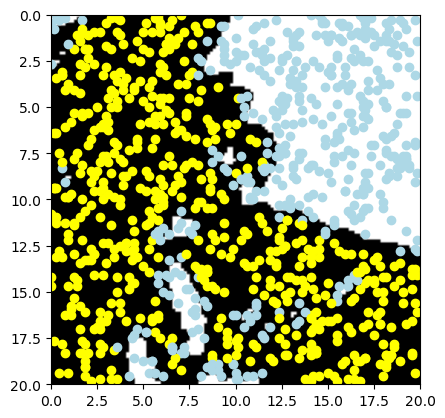

In [147]:
plt.imshow(light, extent=(0,20,20,0))
for i in range(1000):
    select_point=np.random.choice(128, 2).reshape(1,-1)

    min_dist=cdist(select_point, abc_array).min()

    if min_dist> 4:
        print(select_point, min_dist)
        plt.scatter(select_point[0][1]*20/128, select_point[0][0]*20/128, color='yellow')
    else:
        plt.scatter(select_point[0][1]*20/128, select_point[0][0]*20/128, color='lightblue')


In [78]:
abc_array

array([[  0,  22],
       [  0,  30],
       [  0,  31],
       ...,
       [127, 114],
       [127, 115],
       [127, 116]], dtype=int64)

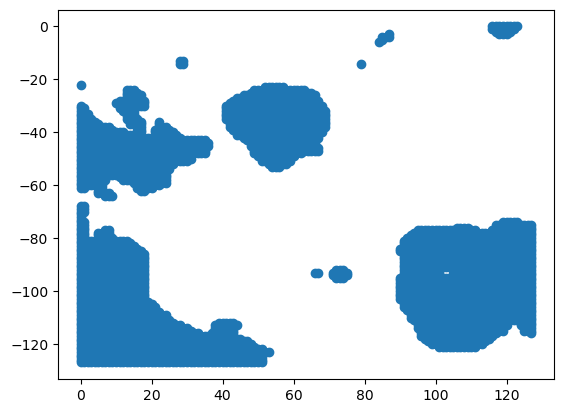

In [90]:
plt.scatter(abc_array[:,0], -abc_array[:,1])

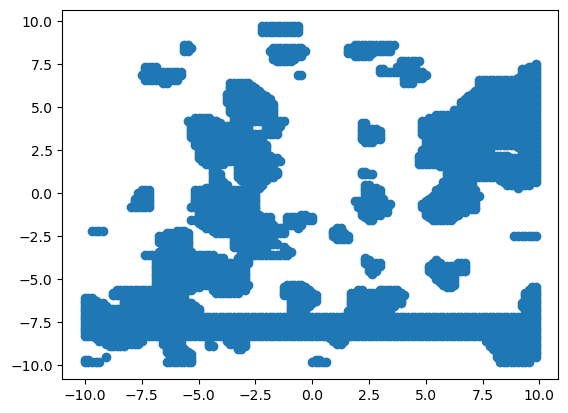

In [117]:
plt.scatter(abc_array[:,1]*20/128-10, -abc_array[:,0]*20/128+10)

[[ 2 69]] 1.40625
[[81 82]] 1.1048543456039805
[[ 72 117]] 1.137517170200081
[[  3 119]] 2.3799290955824715
[[40 64]] 1.3350005852058642
[[30 12]] 1.4740595518838442
[[28 70]] 1.8814991529362963
[[82 93]] 1.4405538214520135
[[10 21]] 1.09375
[[32 89]] 1.2203515118604147
[[38 71]] 1.09375
[[58  3]] 2.096313728906053
[[ 13 101]] 1.137517170200081
[[41  2]] 3.782412011534439
[[37  4]] 3.101473943949876
[[ 84 113]] 1.3258252147247764
[[89  8]] 1.4405538214520135
[[93 71]] 1.3350005852058642
[[15  4]] 2.03125
[[81 89]] 1.6609602832397892
[[31 91]] 1.1267347735824966
[[ 92 118]] 1.6609602832397892
[[45 67]] 1.7258376589355096
[[21  8]] 1.2597277731716483
[[ 12 108]] 1.6312978920172736
[[ 73 116]] 1.0481568644530266
[[12  9]] 1.4740595518838442
[[47 59]] 1.0004881620988826
[[21 68]] 1.1048543456039805
[[44 70]] 1.25
[[30 22]] 1.09375
[[11 41]] 1.71875
[[66 67]] 1.1899645477912357
[[44 63]] 1.4405538214520135
[[ 14 106]] 1.4740595518838442
[[45  8]] 3.0777680630612823
[[29 26]] 1.0481568644530

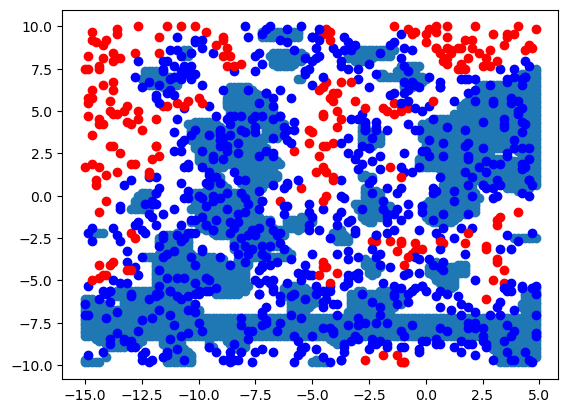

In [118]:
# plt.imshow(light, extent=(-10, 10, 10, -10))
plt.scatter(-15+abc_array[:,1]*20/128, -abc_array[:,0]*20/128+10)
for i in range(1000):
    select_point=np.random.choice(128, 2).reshape(1,-1)

    min_dist=cdist(select_point, abc_array).min()*20/128

    if min_dist> 1:
        print(select_point, min_dist)
        plt.scatter(-15+select_point[0][1]*20/128, 10-select_point[0][0]*20/128, color='r')
    else:
        plt.scatter(-15+select_point[0][1]*20/128, 10-select_point[0][0]*20/128, color='b')

In [46]:
np.random.choice(128, 2).reshape(1,-1)

array([[ 40, 118]])

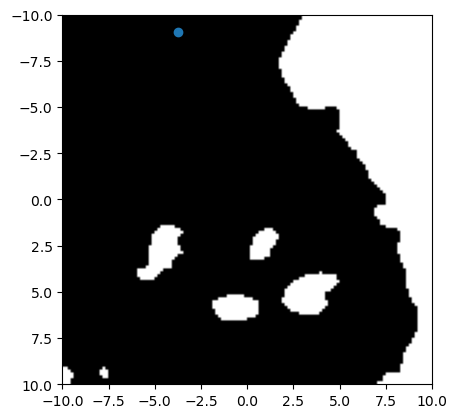

In [56]:
plt.imshow(light, extent=(-10, 10, 10, -10))
plt.scatter(-10+40*20/128, -10+6*20/128)

In [29]:
abc=pd.read_csv('tip_pos_data_action_succ_12_5_15_15_209.csv')

In [30]:
abc.loc[108].diss_mvoltage

2550.903564691544

In [31]:
abc.loc[[108, 185, 109, 110, 153, 163, 202]]

,Unnamed: 0,current_time,label,relative_diss_x_before,relative_diss_y_before,diss_mvoltage,diss_pcurrent
108,108,4_19_19_44,176_3,-0.316237,-0.303665,2550.903565,994.800568
185,185,12_1_3_26,39_1,-0.494507,-0.239884,3515.049356,841.460824
109,109,4_19_19_44,178_0,-0.088235,-0.198402,2849.711162,1119.004011
110,110,4_19_19_44,181_1,0.104988,-0.157335,3057.769251,717.386985
153,153,11_14_20_59,7_1,0.561528,-0.450756,3180.476803,952.473736
163,163,11_26_6_24,21_2,0.078278,-0.045679,3581.759429,881.108880
202,202,12_5_15_15,72_0,0.369827,-0.275093,3255.627716,609.900856


In [32]:
(np.random.random(1)*np.pi)[0]

2.8308054975570456

In [33]:
abc[(abc['diss_mvoltage']<3500) & (abc['diss_mvoltage']>2500)].reset_index()

,index,Unnamed: 0,current_time,label,relative_diss_x_before,relative_diss_y_before,diss_mvoltage,diss_pcurrent
0,0,0,4_10_22_57,5_2,0.240398,-0.203623,3120.866224,330.562870
1,3,3,4_10_22_57,18_7,-0.455150,0.305826,3091.959131,925.271344
2,5,5,4_10_22_57,23_3,-0.509595,0.418833,3305.376494,1027.095652
3,6,6,4_10_22_57,39_2,0.343943,0.432374,3357.890809,1166.250229
4,7,7,4_10_22_57,43_0,0.521632,0.541031,3134.651601,1112.672424
...,...,...,...,...,...,...,...,...
136,200,200,12_5_15_15,58_2,-0.319722,0.666117,3299.155802,856.782174
137,202,202,12_5_15_15,72_0,0.369827,-0.275093,3255.627716,609.900856
138,204,204,12_5_15_15,77_3,0.248605,0.097826,3481.592321,938.136506
139,207,207,12_5_15_15,134_1,0.004727,0.821896,3266.380006,859.159470


<Figure size 800x800 with 0 Axes>

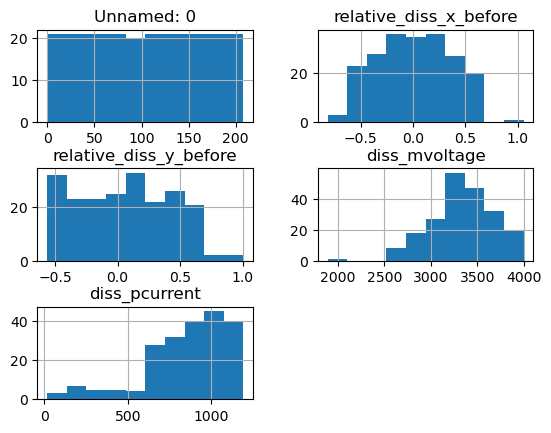

In [34]:
plt.figure(figsize=(8, 8))
abc.hist()
plt.subplots_adjust(hspace=0.5)

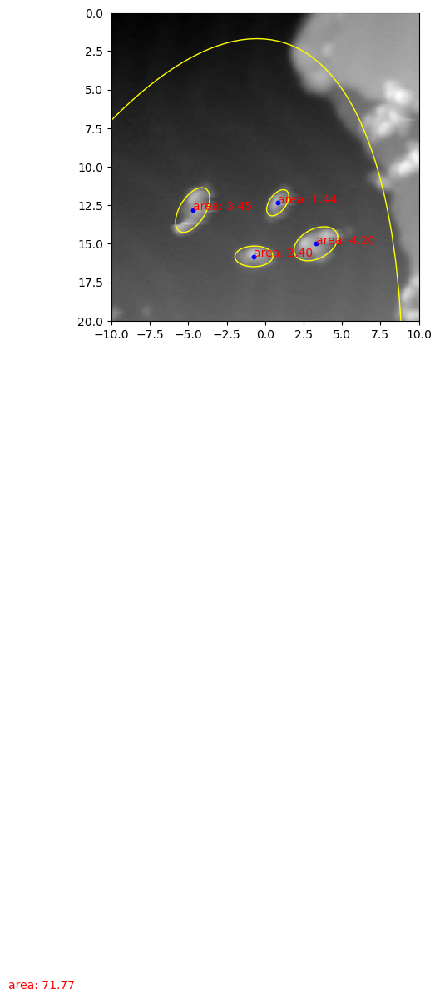

In [35]:
img_prop_large=mol_property(img_large, offset_x_nm=0, offset_y_nm=0, len_nm=20)
img_prop_large.center_points_from_contour()

In [25]:
current_time

'6_11_8_24'

In [37]:
# save_path='all_output/get_new_region_4_15_15_34/scan_img_large_4_15_15_34'
save_path='all_output/get_new_region_5_20_11_4/scan_img_large_5_20_11_4'
episode_i=64
diss_i=1
kkk=16

# img=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
img_large=cv2.imread('%s/img_forward_%d_%d_%d.png' % (save_path, episode_i, diss_i, kkk), cv2.IMREAD_GRAYSCALE)

In [38]:
# save_path='all_output/get_new_region_4_15_15_34/scan_img_large_4_15_15_34'
save_path='all_output/get_new_region_4_13_14_41/scan_img_large_4_13_14_41'
episode_i=89
diss_i=5
kkk=1

# img=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
img_large=cv2.imread('%s/img_forward_%d_%d_%d.png' % (save_path, episode_i, diss_i, kkk), cv2.IMREAD_GRAYSCALE)

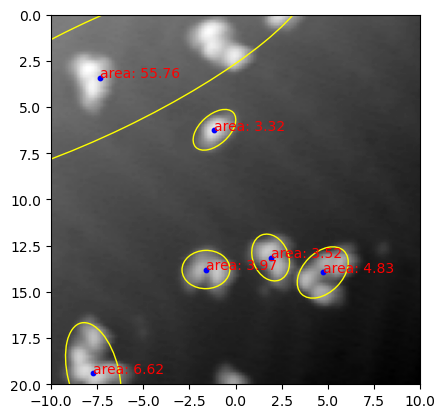

In [4]:
img_prop_large=mol_property(img_large, offset_x_nm=0, offset_y_nm=0, len_nm=20)
img_prop_large.detect_contours()
img_prop_large.center_points_from_contour()

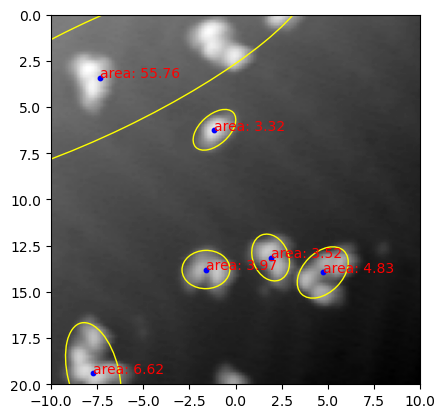

In [6]:
img_prop_large.center_points_from_contour(mol_area_limit=[1.0, 2.5])

In [3]:

# img=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
img_large=cv2.imread('all_output/get_new_region_6_15_22_13/scan_img_large_6_15_22_13/img_forward_0_1.png', cv2.IMREAD_GRAYSCALE)

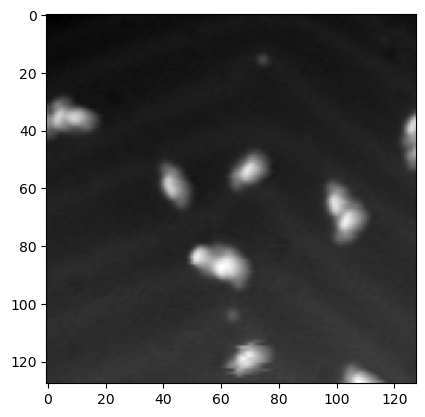

In [41]:
plt.imshow(img_large)

In [ ]:
detect_mols_1=img_prop_large.detect_mol_from_points()
# detect_mols_1=img_prop_large.detect_mol_from_points()

# select mol from contours
img_prop_large.center_points_from_contour(mol_area_limit=[1.0, 2.5])
detect_mols_2=img_prop_large.detect_mols_center_from_contours

[[1.71875, 0.0],
 [-1.25, 0.15625],
 [0.0, 1.5625],
 [-2.34375, 1.71875],
 [-8.4375, 2.03125],
 [-6.875, 2.96875],
 [-8.59375, 3.90625],
 [-1.40625, 5.625],
 [1.40625, 12.34375],
 [4.84375, 12.96875],
 [-1.875, 13.125],
 [2.34375, 13.90625],
 [4.21875, 14.6875],
 [-8.125, 16.875],
 [-8.90625, 18.59375],
 [-7.03125, 18.90625],
 [-0.46875, 19.6875]]

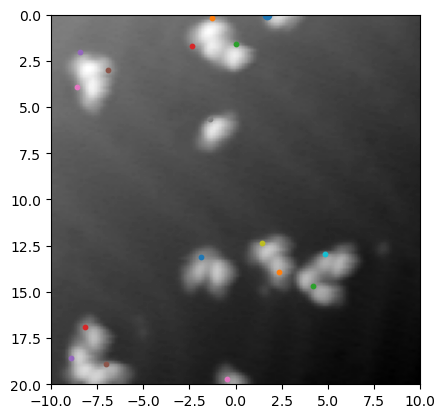

In [5]:
img_prop_large.select_points()

In [23]:
np.random.seed(10)

In [24]:
np.random.randn(1)

array([1.3315865])

In [43]:
img_prop_large.detect_mols_center_from_contours

[[0.87, 18.63], [-3.18, 9.23], [0.91, 8.43], [-8.84, 5.87]]

In [44]:
img_prop_large.detect_mol_from_points()

[[-9.375, 5.15625],
 [0.9375, 7.96875],
 [-3.4375, 8.75],
 [0.46875, 17.96875],
 [6.40625, 19.375]]

In [45]:
img_prop_large.detect_contours(method='global')

In [46]:
img_large[img_large<175]=0
# img_large[img_large>200]=0

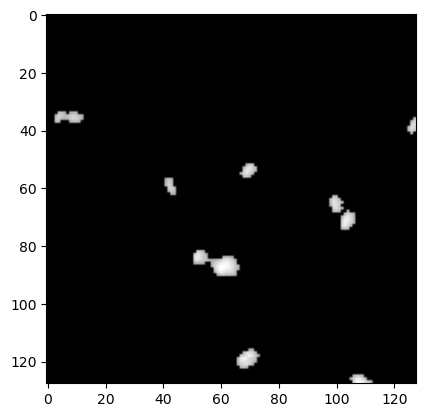

In [47]:
plt.imshow(img_large)

In [48]:
len(img_large.ravel())

16384

(array([16120.,     0.,     0.,     0.,     0.,     0.,    24.,   119.,
           86.,    35.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <BarContainer object of 10 artists>)

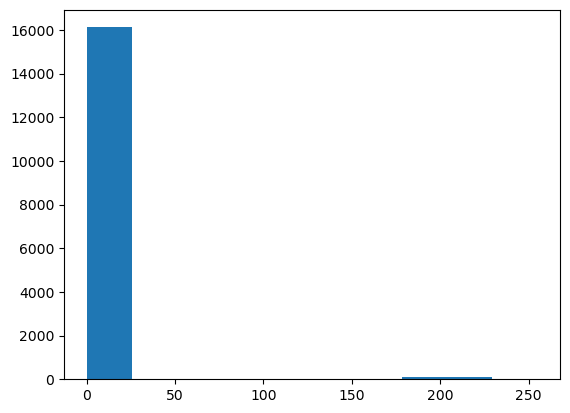

In [49]:
plt.hist(img_large.ravel())

[[-9.375, 5.46875],
 [9.84375, 5.78125],
 [0.9375, 8.125],
 [-3.4375, 9.0625],
 [5.46875, 10.0],
 [-1.875, 12.8125],
 [0.0, 13.28125],
 [0.78125, 18.28125],
 [6.71875, 19.53125]]

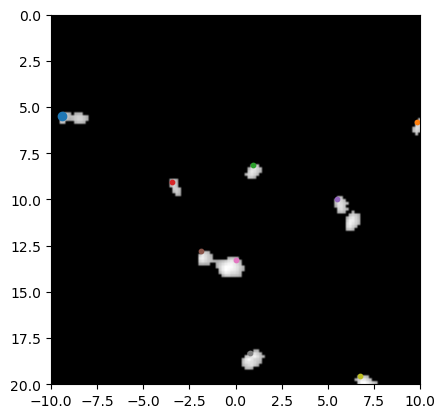

In [50]:
img_prop_large.select_points(light_limit=[170, 200])

In [51]:
img_prop_large=mol_property(img_large, offset_x_nm=0, offset_y_nm=0, len_nm=20)
img_prop_large.detect_contours()
img_prop_large.center_points_from_contour(thres_otsu_blur_kernel=5, thres_global=[170, 255])

TypeError: center_points_from_contour() got an unexpected keyword argument 'thres_otsu_blur_kernel'

In [ ]:
plt.figure(figsize=(9, 100))
succ=1
for i in range(40, 250, 20):
    for j in range(i, 250, 20):

        plt.subplot(50, 6, succ)
        thres_otsu_blur_kernel=5
        # blur = cv2.GaussianBlur(img_large, (thres_otsu_blur_kernel, thres_otsu_blur_kernel), 0)
        # ret,thresh = cv2.threshold(blur, i, j, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        # ret, thresh = cv2.threshold(img_large, i, j, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        ret, thresh = cv2.threshold(img_large, i, j, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        [len(cnt) for cnt in contours]
        plt.imshow(thresh)
        plt.title('%d_%d' % (i, j))
        succ+=1

In [ ]:
plt.imshow(thresh)

In [ ]:
img_prop_large.detect_mol_from_points()

In [ ]:
ret,thresh = cv2.threshold(img_large, 170, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
[len(cnt) for cnt in contours]

In [ ]:
img_prop_large=mol_property(img_large, offset_x_nm=0, offset_y_nm=0, len_nm=20)
img_prop_large.contours=contours
img_prop_large.contours_points_num=[len(cnt) for cnt in contours]
# img_prop_large=mol_property(img_large, offset_x_nm=0, offset_y_nm=0, len_nm=20)
# img_prop_large.detect_contours()

In [ ]:
img_prop_large.center_points_from_contour()

In [ ]:
contours=img_prop_large.contours

In [ ]:
contours_points_num = [len(cnt) for cnt in 
                       contours]

In [ ]:
contours_points_num

In [ ]:
        if method == 'otsu':
            self.ret,self.thresh = cv2.threshold(self.img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        elif method == 'global':
            self.ret,self.thresh = cv2.threshold(self.img, thres_global[0], thres_global[1], cv2.THRESH_BINARY)
        elif method == 'otsu_gaussian':
            blur = cv2.GaussianBlur(self.img, (thres_otsu_blur_kernel, thres_otsu_blur_kernel), 0)
            self.ret,self.thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        self.contours, _ = cv2.findContours(self.thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        self.contours_points_num = [len(cnt) for cnt in self.contours]
        self.contours_max = self.contours[np.argmax(self.contours_points_num)]


In [ ]:
for k in range(6,10):
    print(k)

In [ ]:
plt.figure(figsize=(9, 500))
succ=1
for i in range(5, 10):
    for j in range(10):
        for k in range(1,10):
            save_path='all_output/get_new_region_4_13_14_41/scan_img_large_4_13_14_41'
            # episode_i=5
            # diss_i=0
            # kkk=14
            # img=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
            if os.path.exists('%s/img_forward_%d_%d_%d.png' % (save_path, i, j,k)):
                print(i, j, k)
                
                plt.subplot(120, 4, succ)
                img_large=cv2.imread('%s/img_forward_%d_%d_%d.png' % (save_path, i, j, k), cv2.IMREAD_GRAYSCALE)

                img_prop_large=mol_property(img_large, offset_x_nm=0, offset_y_nm=0, len_nm=20)
                img_prop_large.center_points_from_contour()
                succ=succ+1

In [ ]:
img_prop_large.detect_contours(thres_otsu_blur_kernel=5)

In [ ]:
img_prop_large.contours

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Ellipse
from scipy.spatial.distance import cdist







class mol_property:

    def __init__(self, img, pixel=None, offset_x_nm=0, offset_y_nm=0, len_nm=None) -> None:
        if pixel is None:
            pixel = img.shape[0]
        if len_nm is None:
            len_nm = img.shape[0]

        self.pixel = pixel
        self.offset_x_nm = offset_x_nm
        self.offset_y_nm = offset_y_nm
        self.len_nm = len_nm
        self.unit_nm = self.len_nm/self.pixel
        self.img = img
    
    def detect_contours(self, method='otsu', thres_global=[50, 255], thres_otsu_blur_kernel=5):
        if method == 'otsu':
            self.ret,self.thresh = cv2.threshold(self.img, thres_global[0], thres_global[1], cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        elif method == 'global':
            self.ret,self.thresh = cv2.threshold(self.img, thres_global[0], thres_global[1], cv2.THRESH_BINARY)
        elif method == 'otsu_gaussian':
            blur = cv2.GaussianBlur(self.img, (thres_otsu_blur_kernel, thres_otsu_blur_kernel), 0)
            self.ret,self.thresh = cv2.threshold(blur, thres_global[0], thres_global[1], cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        self.contours, _ = cv2.findContours(self.thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        self.contours_points_num = [len(cnt) for cnt in self.contours]
        self.contours_max = self.contours[np.argmax(self.contours_points_num)]


    def contour_property(self, cnt=None, round_digit=2):
        
        if cnt is None:
            self.detect_contours()
            cnt = self.contours_max
        self.cnt = cnt
        self.area = cv2.contourArea(cnt)*self.unit_nm*self.unit_nm
        self.perimeter = cv2.arcLength(cnt, True)*self.unit_nm
        self.convexity = cv2.isContourConvex(cnt)
        # approximate as a rectangule
        self.rect_x, self.rect_y, self.rect_w, self.rect_h = cv2.boundingRect(cnt)
        self.rect_x, self.rect_y, self.rect_w, self.rect_h = round(self.rect_x*self.unit_nm+self.offset_x_nm-self.len_nm/2, round_digit), round(self.rect_y*self.unit_nm+self.offset_y_nm, round_digit), round(self.rect_w*self.unit_nm, round_digit), round(self.rect_h*self.unit_nm, round_digit)

        # approximate as a minimum area rectangle
        self.rect_min = cv2.minAreaRect(cnt)
        self.rect_min_x, self.rect_min_y = round(self.rect_min[0][0]*self.unit_nm+self.offset_x_nm-self.len_nm/2, round_digit), round(self.rect_min[0][1]*self.unit_nm+self.offset_y_nm, round_digit)
        self.rect_min_w, self.rect_min_h = round(self.rect_min[1][0]*self.unit_nm, round_digit), round(self.rect_min[1][1]*self.unit_nm, round_digit)
        self.rect_min_angle = round(self.rect_min[2], round_digit)

        # approximate as a circle
        self.circle = cv2.minEnclosingCircle(cnt)
        (self.circle_x, self.circle_y), self.circle_radius = self.circle
        self.circle_x, self.circle_y, self.circle_radius = round(self.circle_x*self.unit_nm+self.offset_x_nm-self.len_nm/2, round_digit), round(self.circle_y*self.unit_nm+self.offset_y_nm, round_digit), round(self.circle_radius*self.unit_nm, round_digit)

        # approximate as a ellipse
        self.ellipse = cv2.fitEllipse(cnt) # (center_x, center_y), (width, height), angle
        self.ellipse_x, self.ellipse_y = round(self.ellipse[0][0]*self.unit_nm+self.offset_x_nm-self.len_nm/2, round_digit), round(self.ellipse[0][1]*self.unit_nm+self.offset_y_nm, round_digit)
        self.ellipse_width, self.ellipse_height = round(self.ellipse[1][0]*self.unit_nm, round_digit), round(self.ellipse[1][1]*self.unit_nm, round_digit)
        self.ellipse_angle = round(self.ellipse[2], round_digit)

    def center_points_from_contour(self, dist_thres=1.8, mol_area_limit=[1.5, 2.8], round_digit=2, plot_graph=True,  thres_global=[50, 255], thres_otsu_blur_kernel=5):
        selected_points_from_contours=[]
        detect_mols_from_contours=[]
        detect_mols_center_from_contours=[]
        # self.detect_contours(thres_global=thres_global, thres_otsu_blur_kernel=thres_otsu_blur_kernel)
        for i in range(len(self.contours)):
            if self.contours_points_num[i]>10:
                cnt = self.contours[i]
                ellipse = cv2.fitEllipse(cnt) # (center_x, center_y), (width, height), angle
                ellipse_x, ellipse_y = round(ellipse[0][0]*self.unit_nm+self.offset_x_nm-self.len_nm/2, round_digit), round(ellipse[0][1]*self.unit_nm+self.offset_y_nm, round_digit)
                ellipse_width, ellipse_height = round(ellipse[1][0]*self.unit_nm, round_digit), round(ellipse[1][1]*self.unit_nm, round_digit)
                ellipse_angle = round(ellipse[2], round_digit)
                selected_points_from_contours.append([ellipse_x, ellipse_y])
                area = cv2.contourArea(cnt)*self.unit_nm*self.unit_nm
                
                if plot_graph:
                    plt.scatter(ellipse_x, ellipse_y, s=10, c='b')
                    plt.gca().add_patch(Ellipse((ellipse_x, ellipse_y), width=ellipse_width, height=ellipse_height, angle=ellipse_angle, color='yellow', fill=False))
                    plt.text(ellipse_x, ellipse_y, 'area: %.2f' % (area), color='red', fontsize=10)
                if area>mol_area_limit[0] and area<mol_area_limit[1]:
                    detect_mols_from_contours.append(ellipse)
                    detect_mols_center_from_contours.append([ellipse_x, ellipse_y])
                    # if plot_graph:
                    #     cv2.ellipse(self.img, ellipse, (255, 0, 0), 2)
                    #     plt.gca().add_patch(Ellipse((ellipse_x, ellipse_y), width=ellipse_width, height=ellipse_height, angle=ellipse_angle, color='yellow', fill=False))

        if plot_graph:
            plt.imshow(self.img, extent=[self.offset_x_nm-self.len_nm/2, self.offset_x_nm+self.len_nm/2, self.offset_y_nm+self.len_nm, self.offset_y_nm])
            plt.ylim(self.offset_y_nm+self.len_nm, self.offset_y_nm)
            plt.xlim(self.offset_x_nm-self.len_nm/2, self.offset_x_nm+self.len_nm/2)
        self.selected_points_from_contours = selected_points_from_contours
        self.detect_mols_from_contours = detect_mols_from_contours
        self.detect_mols_center_from_contours = detect_mols_center_from_contours




    

    def plot_contour(self, cnt=None, color=(255, 0, 0), thickness=1, ellipse=True, rect=False, circle=False, text=False):
        self.contour_property(cnt=cnt)
        cv2.drawContours(self.img, self.cnt, 0, color, thickness)
        cv2.ellipse(self.img, self.ellipse, color, thickness)
        plt.imshow(self.img, extent=[self.offset_x_nm-self.len_nm/2, self.offset_x_nm+self.len_nm/2, self.offset_y_nm+self.len_nm, self.offset_y_nm])
        plt.scatter(self.ellipse_x, self.ellipse_y, c='blue', s=20)
        if text:
            plt.text(self.ellipse_x, self.ellipse_y, 'w: %.2f h: %.2f ang: %.2f area: %.2f' % (self.ellipse_width, self.ellipse_height, self.ellipse_angle, self.area), color='red', fontsize=10)

    

    def detect_edges(self, light_limit=[100, 200], blur_kernel=5) -> tuple:

        # Display original image


        # Blur the image for better edge detection
        img_blur= cv2.GaussianBlur(self.img, (blur_kernel,blur_kernel), 0) 
        
        # Sobel Edge Detection
        sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
        sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
        sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection
        # Display Sobel Edge Detection Images
        
        # Canny Edge Detection
        self.edges = cv2.Canny(image=img_blur, threshold1=light_limit[0], threshold2=light_limit[1]) # Canny Edge Detection

    
    
    def select_points(self, shape_type='blob', dist_thres=1.8, light_limit=[50, 150], s=10, plot_graph=True):
        '''selct points from detected edges for large image (such as 250 nm) and select points from dectected blobs for small image (such as 10 nm)
        shape_type: 'blob' or 'edge'
        dist_thres: the distance threshold between two points (approximate to molecule size)
        light_limit: the light limit for selecting blob points
        plot_graph: plot the selected points on the image
        '''
        
        if shape_type=='edge':
            self.detect_edges()
            detect_mols=np.where(self.edges>0)
        else:
            detect_mols=np.where(self.img>light_limit[1])

        
        data_mols ={'x': detect_mols[1], 'y': detect_mols[0]}
        data_mols=pd.DataFrame(data_mols)
        data_mols=data_mols.drop_duplicates(ignore_index=True)

        selected_points=[]
        selected_points.append([data_mols.x[0], data_mols.y[0]])
        if plot_graph:
            plt.imshow(self.img, extent=[self.offset_x_nm-self.len_nm/2, self.offset_x_nm+self.len_nm/2, self.offset_y_nm+self.len_nm, self.offset_y_nm])
            plt.scatter(self.offset_x_nm-self.len_nm/2+self.unit_nm*data_mols.x[0], self.offset_y_nm+self.unit_nm*data_mols.y[0])
        for i in range(len(data_mols)):
            selected_points_array=np.array(selected_points)
            if np.sqrt((data_mols.x[i]-selected_points_array[:, 0])**2+(data_mols.y[i]-selected_points_array[:, 1])**2).min()*self.unit_nm>dist_thres:
                selected_points.append([data_mols.x[i], data_mols.y[i]])
                if plot_graph:
                    plt.scatter(self.offset_x_nm-self.len_nm/2+self.unit_nm*data_mols.x[i], self.offset_y_nm+self.unit_nm*data_mols.y[i], s=s)

        if plot_graph:
            plt.xlim(self.offset_x_nm-self.len_nm/2, self.offset_x_nm+self.len_nm/2)
            plt.ylim(self.offset_y_nm+self.len_nm, self.offset_y_nm)


        self.selected_points_nm=[[selected_points[i][0]*self.unit_nm+self.offset_x_nm-self.len_nm/2, selected_points[i][1]*self.unit_nm+self.offset_y_nm] for i in range(len(selected_points))]
        return self.selected_points_nm
    
    def detect_mol_from_points(self, mol_dist_thres=2.5):
        '''select indivisal molecules from selected points (absolute position in points))'''
        self.select_points(plot_graph=False)
        mol_points=[]
        dist=cdist(np.array(self.selected_points_nm), np.array(self.selected_points_nm))
        for i in range(len(self.selected_points_nm)):
            if len(np.nonzero(dist[i])[0])>0:
                mol_min_dist = np.min(dist[i][np.nonzero(dist[i])])
                if mol_min_dist>mol_dist_thres:
                    mol_points.append(self.selected_points_nm[i])
        return mol_points






In [ ]:
img_prop_large.center_points_from_contour()

In [ ]:
img_prop_large.plot_contour(color=(255, 0, 0), thickness=1, ellipse=True, rect=False, circle=False, text=True)

In [ ]:
img_prop_large.select_points(dist_thres=1.95)

In [ ]:
img_prop_large.detect_mols_center_from_contours

In [ ]:
img_prop_large.center_points_from_contour()
detect_mols_2=img_prop_large.detect_mols_center_from_contours

In [ ]:
plt.imshow(img)

In [ ]:
episode_i=0
diss_i=0
# img=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
img=cv2.imread('%s/img_forward_1_0_4_0.png' % ('all_output\get_new_region_4_2_16_48\scan_img_before_4_2_16_48'), cv2.IMREAD_GRAYSCALE)

img2=cv2.resize(img, (128,128), interpolation=cv2.INTER_AREA)
img2=torch.tensor(img2).unsqueeze(0).unsqueeze(0).float()

In [ ]:
pwd

In [ ]:
img=cv2.imread('%s/img_forward_%d_%d.png' % (img_path, i, j), cv2.IMREAD_GRAYSCALE)

In [ ]:
plt.imshow(img)

In [ ]:
img_path='all_output/approach_4_4_14_34/scan_img_4_4_14_34'
# img_path='all_output/approach_4_7_16_29/scan_img_4_7_16_29'
# plt.imshow(img, extent=[0, 128, 0, 128])
# plt.imshow(img, extent=[128, 256, 0, 128])

approach_limit = [-320, 320, -320, 320]
scan_len_nm = 200
pixel= 256


# Initialize the movie
fig = plt.figure()
# The spines
fig, ax = plt.subplots()


plt.setp(ax.spines.values(), linewidth=2)

# The ticks
ax.xaxis.set_tick_params(width=2)
ax.yaxis.set_tick_params(width=2)

# seperate the approach area into small scanning regions
num_x=(approach_limit[1]-approach_limit[0])/scan_len_nm
num_y=(approach_limit[3]-approach_limit[2])/scan_len_nm
num_xy=int(np.min([num_x, num_y]))

for i in range(num_xy):
    for j in range(num_xy):
        x_nm=approach_limit[0]+scan_len_nm/2+i*scan_len_nm
        y_nm=approach_limit[2]+j*scan_len_nm
        img=cv2.imread('%s/img_forward_%d_%d.png' % (img_path, i, j), cv2.IMREAD_GRAYSCALE)
        plt.imshow(img, extent=[x_nm-scan_len_nm/2, x_nm+scan_len_nm/2, y_nm+scan_len_nm, y_nm])
        print('scanning regions', i, j, x_nm, y_nm, scan_len_nm)

        # plt.scatter(x_nm, y_nm, c='r')

data=data_all_diss
for i in range(len(data)):
        if i % 50 == 0:
            plt.text(data['mol_center_x_nm'][i], data['mol_center_y_nm'][i], str(i), color='orange', fontsize=12)
        if data['done_diss'][i] == True:
            plt.scatter(data['mol_center_x_nm'][i], data['mol_center_y_nm'][i], c='orange', edgecolor='none', s=20)
            # plt.gca().add_patch(patches.Rectangle((data['mol_center_x_nm'][i]-scan_len_nm_small/2, data['mol_center_y_nm'][i]-scan_len_nm_small/2), scan_len_nm_small, scan_len_nm_small, fill=False, linewidth=3))
            # continue
        else:
            plt.scatter(data['mol_center_x_nm'][i], data['mol_center_y_nm'][i], c='lightblue', edgecolor='none', s=20)
            continue


plt.plot(data['mol_center_x_nm'], data['mol_center_y_nm'], 'white',  linewidth=2, zorder=0, alpha=0.5)
# plt.plot(data_all_diss['diss_x_nm'], data_all_diss['diss_y_nm'], c='white')
# plt.scatter(data_all_diss['diss_x_nm'], data_all_diss['diss_y_nm'], c='b')
plt.xlim(-300, 280)
plt.ylim(280, -300)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('x (nm)', fontsize=16)
plt.ylabel('y (nm)', fontsize=16)
# plt.plot([i for i in range(-320, 320)], [i for i in range(-320, 320)])

In [ ]:
# img_path='all_output/approach_4_4_14_34/scan_img_4_4_14_34'
img_path='all_output/approach_4_7_16_29/scan_img_4_7_16_29'
# plt.imshow(img, extent=[0, 128, 0, 128])
# plt.imshow(img, extent=[128, 256, 0, 128])

approach_limit = [-320, 320, -320, 320]
scan_len_nm = 200
pixel= 256


# Initialize the movie
fig = plt.figure()
# The spines
fig, ax = plt.subplots()


plt.setp(ax.spines.values(), linewidth=2)

# The ticks
ax.xaxis.set_tick_params(width=2)
ax.yaxis.set_tick_params(width=2)

# seperate the approach area into small scanning regions
num_x=(approach_limit[1]-approach_limit[0])/scan_len_nm
num_y=(approach_limit[3]-approach_limit[2])/scan_len_nm
num_xy=int(np.min([num_x, num_y]))

for i in range(num_xy):
    for j in range(num_xy):
        x_nm=approach_limit[0]+scan_len_nm/2+i*scan_len_nm
        y_nm=approach_limit[2]+j*scan_len_nm
        img=cv2.imread('%s/img_forward_%d_%d.png' % (img_path, i, j), cv2.IMREAD_GRAYSCALE)
        plt.imshow(img, extent=[x_nm-scan_len_nm/2, x_nm+scan_len_nm/2, y_nm+scan_len_nm, y_nm])
        print('scanning regions', i, j, x_nm, y_nm, scan_len_nm)

        # plt.scatter(x_nm, y_nm, c='r')

data=data_all_diss
for i in range(len(data)):
        if i % 50 == 0:
            plt.text(data['mol_center_x_nm'][i], data['mol_center_y_nm'][i], str(i), color='orange', fontsize=12)
        if data['done_diss'][i] == True:
            plt.scatter(data['mol_center_x_nm'][i], data['mol_center_y_nm'][i], c='orange', edgecolor='none', s=20)
            # plt.gca().add_patch(patches.Rectangle((data['mol_center_x_nm'][i]-scan_len_nm_small/2, data['mol_center_y_nm'][i]-scan_len_nm_small/2), scan_len_nm_small, scan_len_nm_small, fill=False, linewidth=3))
            # continue
        else:
            plt.scatter(data['mol_center_x_nm'][i], data['mol_center_y_nm'][i], c='lightblue', edgecolor='none', s=20)
            continue


plt.plot(data['mol_center_x_nm'], data['mol_center_y_nm'], 'white',  linewidth=2, zorder=0, alpha=0.5)
# plt.plot(data_all_diss['diss_x_nm'], data_all_diss['diss_y_nm'], c='white')
# plt.scatter(data_all_diss['diss_x_nm'], data_all_diss['diss_y_nm'], c='b')
plt.xlim(-300, 280)
plt.ylim(280, -300)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('x (nm)', fontsize=16)
plt.ylabel('y (nm)', fontsize=16)
# plt.plot([i for i in range(-320, 320)], [i for i in range(-320, 320)])

In [ ]:
plt.imshow(img)

In [ ]:
data_all_diss[['diss_mvoltage', 'diss_pcurrent']].plot()

In [ ]:
r=[]
for i in range(len(data_all_diss)):
    tip_x=data_all_diss['relative_diss_x'][i]
    tip_y=data_all_diss['relative_diss_y'][i]
    radius=np.sqrt(tip_x**2+tip_y**2)
    r.append(radius)

In [ ]:
data_all_diss['radius']=r

In [ ]:
data_all_diss[data_all_diss['done_diss']==False][['radius']].hist(bins=50)

In [ ]:
data_all_diss[data_all_diss['done_diss']==False][['relative_diss_x', 'relative_diss_y']].hist()

In [ ]:
data_all_diss[data_all_diss['done_diss']==True][['diss_mvoltage', 'diss_pcurrent']].plot()

In [ ]:
data_all_diss[data_all_diss['done_diss']==True][['relative_diss_x', 'relative_diss_y']].hist()

In [ ]:
data_all_diss

In [ ]:
data_all_diss.sort_values(by='relative_diss_x', ascending=False)

In [ ]:
list(data_all_diss)

In [ ]:
data_all_diss['action']

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
times=np.array([i for i in range(20)])

value_1=1*0.90**times
value_2=0.05-1.05**times*0.6 + 0.5
value_3=-1/(0.95)**times*0.7+0.3
 
for i in range(20):
 
    sum_1=value_2[0:i].sum()+value_1[i]
    sum_2=value_2[0:i].sum()+value_3[i]
    sum_3=value_2[0:i].sum()
 
    if i<19:
        plt.scatter(i, sum_1, color='red')
        plt.scatter(i, sum_2, color='blue')
        plt.scatter(i, sum_3, color='green')
 
plt.scatter(i, sum_1, color='red', label='Succ')
plt.scatter(i, sum_2, color='blue', label='Messy')
plt.scatter(i, sum_3, color='green', label='Rotation')
 
plt.plot(times, value_1, color='red')
plt.plot(times, value_2, color='green')
plt.plot(times, value_3, color='blue')
 
plt.legend(fontsize=14)
plt.xlabel('Dissociation times', fontsize=16)
plt.ylabel('Reward', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(-1, 20)


In [ ]:
plt.figure(figsize=(10, 3))
plt.subplot(1, 2, 1)
plt.plot([i for i in range(len(data_all_diss))], [data_all_diss['action'][i][0]*1.0 for i in range(len(data_all_diss))] , color='green')
# plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='lightblue')
plt.xlabel('Episodes')
# plt.ylabel('Voltage (mV)')
# plt.ylim(0, 4000)
plt.subplot(1, 2, 2)
plt.plot([i for i in range(len(data_all_diss))], [data_all_diss['action'][i][1]*1.0 for i in range(len(data_all_diss))] , color='blue')
# plt.plot([i for i in range(len(data_all_diss))], data_all_diss[' tip_y '])
plt.xlabel('Episodes')
# plt.ylabel('Current (pA)')
# plt.ylim(0, 1400)

plt.subplots_adjust(wspace=0.5)

In [ ]:
ttt=data_all_diss_4[data_all_diss_4['label'].str.contains('_0')]

In [ ]:
x=[i[0] for i in data_all_diss['action']]

In [ ]:
y=[i[1] for i in data_all_diss['action']]

In [ ]:
plt.scatter(x, y)

In [ ]:
data_all_diss[['relative_diss_x', 'relative_diss_y', 'diss_mvoltage', 'diss_pcurrent', 'done_diss']].hist()

In [164]:
reward=pd.read_csv('episode_reward_sac_6_21_23_1.txt', header=None)
   

<Axes: >

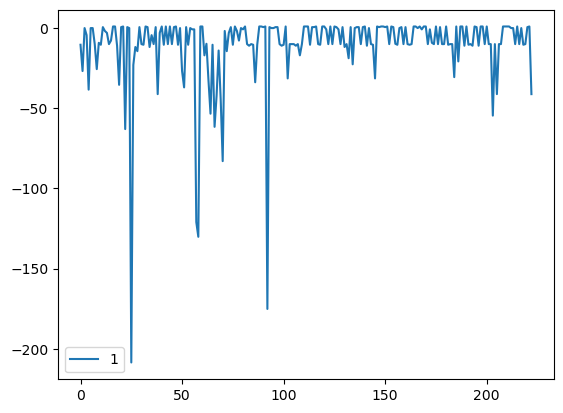

In [165]:
reward[2].max()
reward[[1]].plot()

<Axes: >

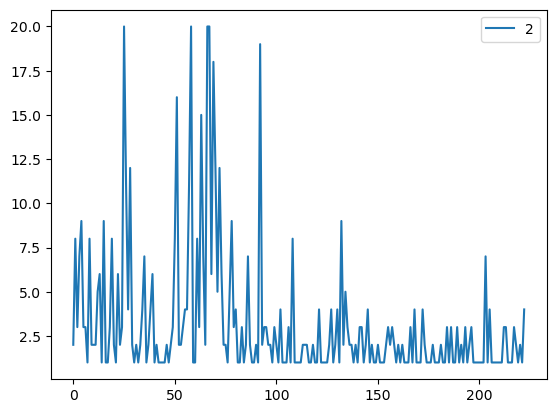

In [166]:
reward[[2]].plot()

<Axes: >

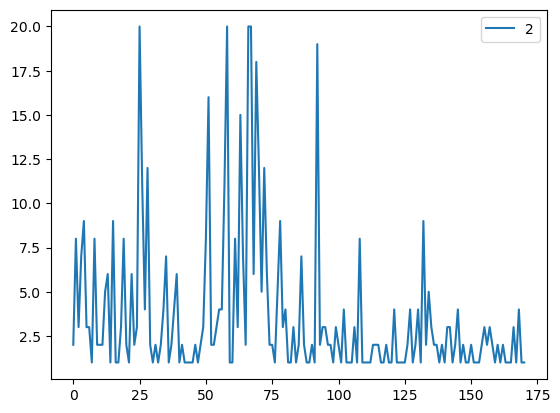

In [131]:
reward[[2]].plot()

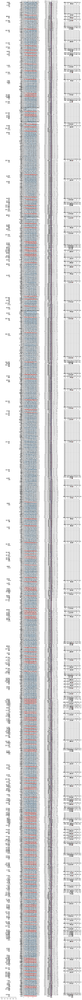

In [151]:
data_all_diss_4=plot_all_diss(current_time=current_time, model='sac', episodes=240)

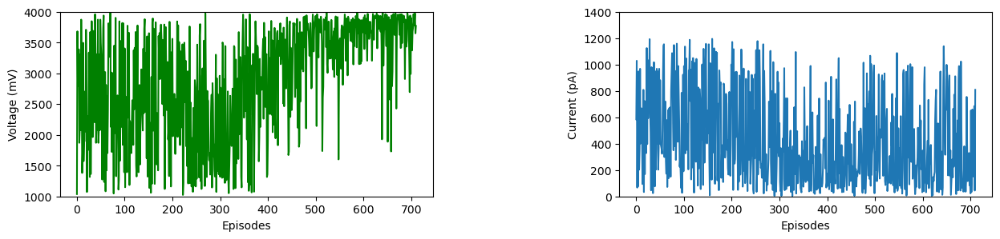

In [152]:
data_all_diss=data_all_diss_4
data_all_diss.loc[:, 'tip_dist'] = np.sqrt(data_all_diss['relative_diss_x']**2+data_all_diss['relative_diss_y']**2)
# data_all_diss=ttt
# data_all_diss=data3
plt.figure(figsize=(15, 3))

plt.subplot(1, 2, 1)
plt.plot([i for i in range(len(data_all_diss))], data_all_diss['diss_mvoltage'], color='green')
# plt.scatter([i for i in range(len(data_all_diss))], data_all_diss['diss_mvoltage'], color='green')
plt.xlabel('Episodes')
plt.ylabel('Voltage (mV)')
plt.ylim(1000, 4000)
plt.subplot(1, 2, 2)
plt.plot([i for i in range(len(data_all_diss))], data_all_diss['diss_pcurrent'])
# plt.scatter([i for i in range(len(data_all_diss))], data_all_diss['diss_pcurrent'])
plt.xlabel('Episodes')
plt.ylabel('Current (pA)')
plt.ylim(0, 1400)

plt.subplots_adjust(wspace=0.5)

<Figure size 1500x500 with 0 Axes>

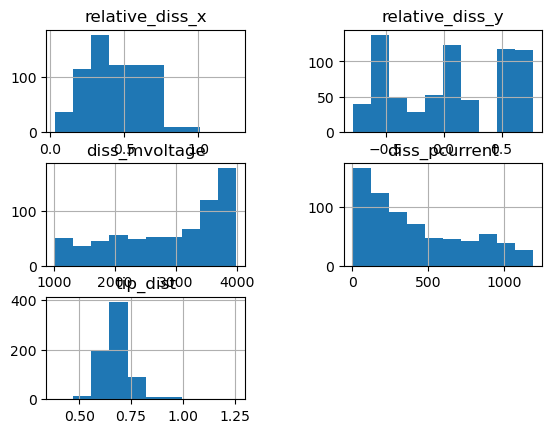

In [153]:
plt.figure(figsize=(15,5))
data_all_diss[['relative_diss_x', 'relative_diss_y', 'diss_mvoltage', 'diss_pcurrent', 'tip_dist']].hist()
plt.subplots_adjust(wspace=0.5)

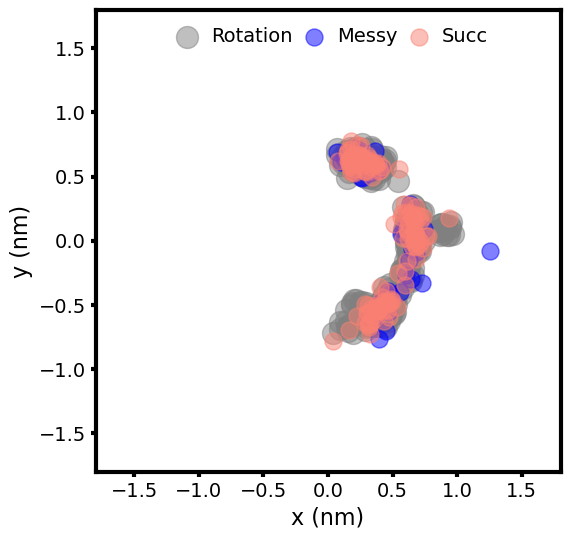

In [154]:
fig, ax = plt.subplots(figsize=(6, 6))

 
 
plt.setp(ax.spines.values(), linewidth=3)
 
# The ticks
ax.xaxis.set_tick_params(width=3)
ax.yaxis.set_tick_params(width=3)

# for i in range(0, len(data_all_diss)):
#     if data_all_diss['done_diss'][i] == False:
#         plt.scatter(data_all_diss['relative_diss_x'][i], data_all_diss['relative_diss_y'][i], c='blue', alpha=0.5, s=50)
#         # plt.scatter(data_all_diss['relative_diss_x_before'][i], data_all_diss['relative_diss_y_before'][i], c='orange')
#         # plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='lightblue')
#         # plt.scatter(data_all_diss['action'][i][2]*3700, data_all_diss['action'][i][3]*1200, c='lightblue')
#         pass
#     else:
#         plt.scatter(data_all_diss['relative_diss_x'][i], data_all_diss['relative_diss_y'][i], c='r', alpha=0.5, s=50)
        # plt.scatter(data_all_diss['relative_diss_x_before'][i], data_all_diss['relative_diss_y_before'][i], c='r')
        # plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='yellow')
        # pass
for i in range(0, len(data_all_diss)):
    if data_all_diss['done_diss'][i] == False:
        # plt.scatter(data_all_diss['relative_diss_x_before'][i], data_all_diss['relative_diss_y_before'][i], c='orange')
        # plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='blue')
        pass
    else:
        # plt.scatter(data_all_diss['relative_diss_x_before'][i], data_all_diss['relative_diss_y_before'][i], c='r')
        # plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='r')
        # plt.scatter(data_all_diss['action'][i][2]*3700, data_all_diss['action'][i][3]*1200, c='r')
        pass
# ax.add_patch(patches.Circle((0, 0), 0.8, color='blue', fill=False, linewidth=2))


plt.scatter(data_all_diss_middle['relative_diss_x'],data_all_diss_middle['relative_diss_y'], color='grey',s=250, alpha=0.5, label='Rotation')
plt.scatter(data_all_diss_episode[data_all_diss_episode['done_diss']!=True]['relative_diss_x'],data_all_diss_episode[data_all_diss_episode['done_diss']!=True]['relative_diss_y'], color='b',s=150, alpha=0.5, label='Messy')
plt.scatter(data_all_diss_episode[data_all_diss_episode['done_diss']==True]['relative_diss_x'],data_all_diss_episode[data_all_diss_episode['done_diss']==True]['relative_diss_y'], color='salmon',s=150, alpha=0.5, label='Succ')

# ax.add_patch(patches.Rectangle((-1.3, -1.3), 2.6, 2.6, color='grey', fill=False, linewidth=2))
# ax.add_patch(patches.Circle((0, 0), 0.9, color='green', fill=False, linewidth=2))

# ax.add_patch(patches.Circle((0, 0), 1.0, color='cyan', fill=False, linewidth=2))
# # ax.add_patch(patches.Circle((0, 0), 0.7, color='green', fill=False, linewidth=2))
# ax.add_patch(patches.Circle((0, 0), 0.5, color='cyan', fill=False, linewidth=2))
# ax.add_patch(patches.Circle((0, 0), 0.48, color='green', fill=False, linewidth=2))

# ax.add_patch(patches.Circle((0, 0), 0.8, color='red', fill=False, linewidth=2))
# ax.add_patch(patches.Circle((0, 0), 1.0, color='red', fill=False, linewidth=2))
# plt.axvline(x=0)
# plt.axhline(y=0)
plt.xlim(-1.8, 1.8)
plt.ylim(-1.8, 1.8)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('x (nm)', fontsize=16)
plt.ylabel('y (nm)', fontsize=16)
plt.legend(frameon=False, fontsize=14, ncol=3, loc='upper center', alignment='center', columnspacing=0.1,  handletextpad=0.2)
# plt.circle2 = plt.Circle((0.0, 0.0), 0.6, color='blue')

# plt.axvline(x=0)
# plt.axhline(y=0)
# plt.xlim(0, 3800)
# plt.ylim(0, 1500)
# plt.xticks(fontsize=14)
# plt.yticks(fontsize=14)
# plt.xlabel('Voltage (mV)', fontsize=16)
# plt.ylabel('Current (pA)', fontsize=16)

# separate rotatio, succ and diss

# Tip position

In [155]:
episode_list=[] 
for episode_i in range(200):
    for diss_i in range(20):
        if     str(episode_i)+'_'+str(diss_i) in data_all_diss['label'].tolist()  and               str(episode_i)+'_'+str(diss_i+1) not in data_all_diss['label'].tolist():
            episode_list.append(str(episode_i)+'_'+str(diss_i))
            break

data_all_diss_episode=data_all_diss[data_all_diss['label'].isin(episode_list)]
data_all_diss_middle=data_all_diss[~data_all_diss['label'].isin(episode_list)]
data_all_diss_episode.reset_index(drop=True, inplace=True)
data_all_diss_middle.reset_index(drop=True, inplace=True)

(array([  2.,   2.,   7.,  62., 179., 180.,  56.,   7.,   9.,   7.]),
 array([0.38513396, 0.4432181 , 0.50130223, 0.55938637, 0.6174705 ,
        0.67555464, 0.73363877, 0.79172291, 0.84980705, 0.90789118,
        0.96597532]),
 <BarContainer object of 10 artists>)

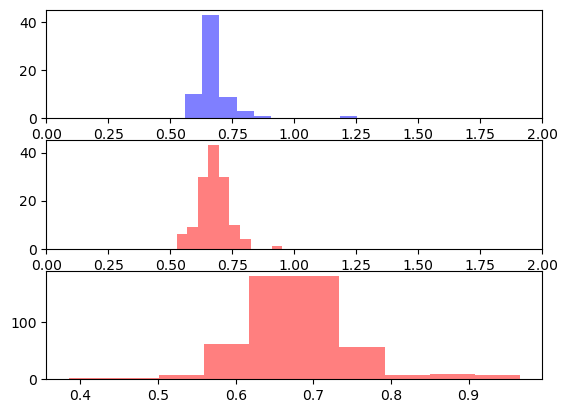

In [156]:
num_subplots=3
plt.subplot(num_subplots, 1, 1)

plt.hist(data_all_diss_episode[data_all_diss_episode['done_diss']==False]['tip_dist'], bins=10, alpha=0.5, color='blue')
plt.xlim(0, 2)

plt.subplot(num_subplots, 1, 2)
plt.hist(data_all_diss_episode[data_all_diss_episode['done_diss']==True]['tip_dist'], bins=10, alpha=0.5, color='red')
plt.xlim(0, 2)

plt.subplot(num_subplots, 1, 3)
plt.hist(data_all_diss_middle['tip_dist'], bins=10, alpha=0.5, color='red')
# plt.xlim(0, 2)

Text(0, 0.5, 'Number')

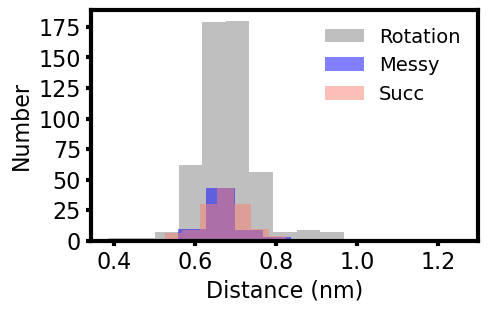

In [157]:
# plt.scatter(data_all_diss_episode['diss_mvoltage'], data_all_diss_episode['diss_pcurrent'])

plt.figure(figsize=(5, 3))
 
ax=plt.gca()
 
 
plt.setp(ax.spines.values(), linewidth=3)
 
# The ticks
ax.xaxis.set_tick_params(width=3)
ax.yaxis.set_tick_params(width=3)
plt.hist(data_all_diss_middle['tip_dist'], bins=10, alpha=0.5, color='grey')

plt.hist(data_all_diss_episode[data_all_diss_episode['done_diss']==False]['tip_dist'], bins=10, alpha=0.5, color='blue')
plt.hist(data_all_diss_episode[data_all_diss_episode['done_diss']==True]['tip_dist'], bins=10, alpha=0.5, color='salmon')

plt.legend(['Rotation', 'Messy', 'Succ'], fontsize=14, frameon=False, loc='upper right')


plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
# plt.xlim(500, 4400)
# plt.ylim(-200, 1500)
plt.xlabel('Distance (nm)', fontsize=16)
plt.ylabel('Number', fontsize=16)



# Current and Votage

Text(0, 0.5, 'Current (pA)')

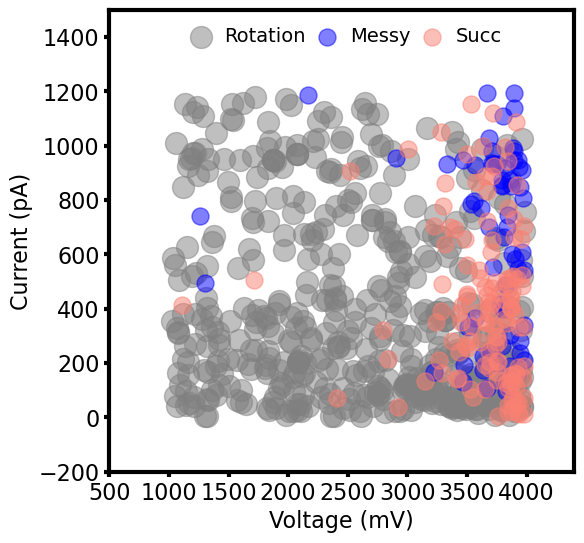

In [158]:

# plt.scatter(data_all_diss_episode['diss_mvoltage'], data_all_diss_episode['diss_pcurrent'])

plt.figure(figsize=(6, 6))
 
ax=plt.gca()
 
 
plt.setp(ax.spines.values(), linewidth=3)
 
# The ticks
ax.xaxis.set_tick_params(width=3)
ax.yaxis.set_tick_params(width=3)

 
plt.scatter(data_all_diss_middle['diss_mvoltage'],data_all_diss_middle['diss_pcurrent'], color='grey',s=250, alpha=0.5, label='Rotation')
plt.scatter(data_all_diss_episode[data_all_diss_episode['done_diss']!=True]['diss_mvoltage'],data_all_diss_episode[data_all_diss_episode['done_diss']!=True]['diss_pcurrent'], color='b',s=150, alpha=0.5, label='Messy')
plt.scatter(data_all_diss_episode[data_all_diss_episode['done_diss']==True]['diss_mvoltage'],data_all_diss_episode[data_all_diss_episode['done_diss']==True]['diss_pcurrent'], color='salmon',s=150, alpha=0.5, label='Succ')

 
 
plt.legend(frameon=False, fontsize=14, ncol=3, loc='upper center', alignment='center', columnspacing=0.1,  handletextpad=0.2)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(500, 4400)
plt.ylim(-200, 1500)
plt.xlabel('Voltage (mV)', fontsize=16)
plt.ylabel('Current (pA)', fontsize=16)



Text(0, 0.5, 'Number')

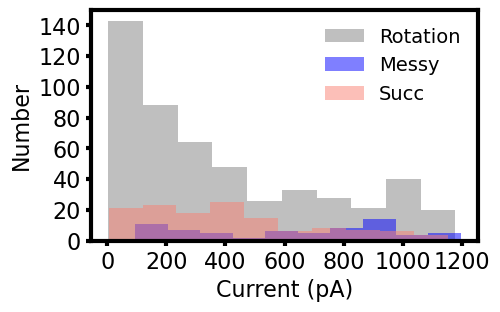

In [159]:

plt.figure(figsize=(5, 3))
 
ax=plt.gca()
 
 
plt.setp(ax.spines.values(), linewidth=3)
 
# The ticks
ax.xaxis.set_tick_params(width=3)
ax.yaxis.set_tick_params(width=3)
plt.hist(data_all_diss_middle['diss_pcurrent'], bins=10, alpha=0.5, color='grey')

plt.hist(data_all_diss_episode[data_all_diss_episode['done_diss']==False]['diss_pcurrent'], bins=10, alpha=0.5, color='blue')
plt.hist(data_all_diss_episode[data_all_diss_episode['done_diss']==True]['diss_pcurrent'], bins=10, alpha=0.5, color='salmon')

plt.legend(['Rotation', 'Messy', 'Succ'], fontsize=14, frameon=False)


plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
# plt.xlim(500, 4400)
# plt.ylim(-200, 1500)
plt.xlabel('Current (pA)', fontsize=16)
# plt.xlabel('Voltage (mV)', fontsize=16)
plt.ylabel('Number', fontsize=16)


# Success rate at the interval of 10

[8, 8, 6, 7, 7, 6, 7, 10, 7, 7, 4, 6, 7, 7, 5, 7, 9, 5, 6, 4, 0, 0, 0, 0, 0]


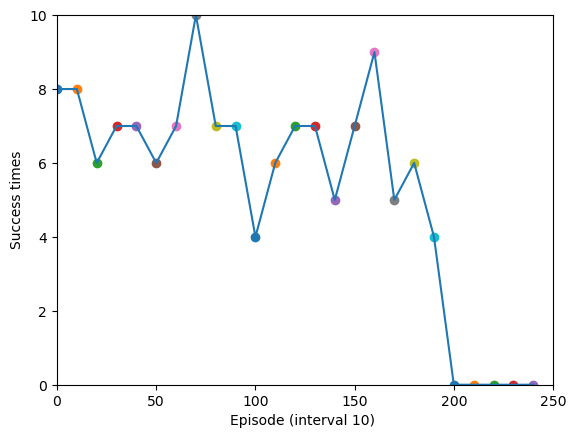

In [161]:
# plt.figure(figsize=(20, 60))
interval=10
len_done=[]
for i in range(0,250, interval):
    # plt.subplot(30, 6, int(i/interval)+1)

    # plt.hist(data_all_diss['done_diss'][i:i+interval])
    if (data_all_diss_episode['done_diss'][i:i+interval]==True).sum()>0:
       len_done.append((data_all_diss_episode['done_diss'][i:i+interval]==True).sum())
    else:
        len_done.append(0)
 
    plt.scatter(i, (data_all_diss_episode['done_diss'][i:i+interval]==True).sum())

plt.plot([i for i in range(0, 250, interval)], len_done)

plt.xlabel('Episode (interval 10) ')
plt.ylabel('Success times')
plt.xlim(0, 250)
plt.ylim(0, 10)
print(len_done)

# Statistic the rate of voltage larger than 2000 mV at the interval of 10 dissociation time

In [162]:
times_record=[] 
for episode_i in range(200):
    for diss_i in range(20):
        if     str(episode_i)+'_'+str(diss_i) in data_all_diss['label'].tolist()  and                data_all_diss[data_all_diss['label']==str(episode_i)+'_'+str(diss_i)]['diss_mvoltage'].values[0]>2500:
            times_record.append([episode_i, diss_i])
            break


    # print(diss_i)

Text(0, 0.5, 'First step with voltage more than 2500 mV')

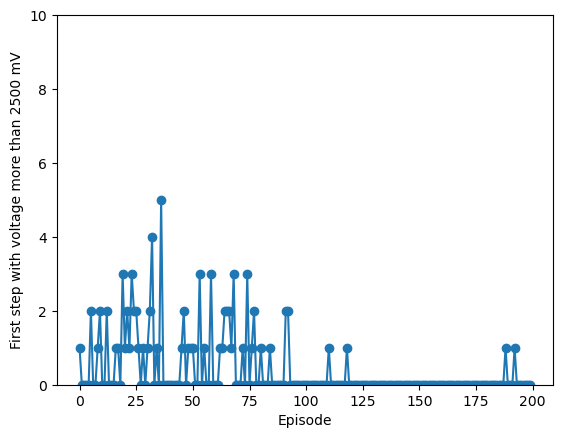

In [163]:
plt.plot(np.array(times_record)[:,0], np.array(times_record)[:,1])
plt.scatter(np.array(times_record)[:,0], np.array(times_record)[:,1])
plt.ylim(0, 10)
plt.xlabel('Episode')
plt.ylabel('First step with voltage more than 2500 mV')

# Success rate at the interval of 10 dissociation times

134


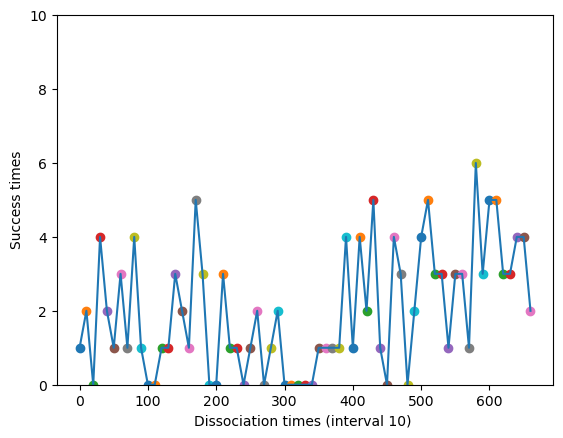

In [150]:
# plt.figure(figsize=(20, 60))
interval=10
len_done=[]
for i in range(0, len(data_all_diss), interval):
    # plt.subplot(30, 6, int(i/interval)+1)

    # plt.hist(data_all_diss['done_diss'][i:i+interval])
    if (data_all_diss['done_diss'][i:i+interval]==True).sum()>0:
       len_done.append((data_all_diss['done_diss'][i:i+interval]==True).sum())
    else:
        len_done.append(0)
 
    plt.scatter(i, (data_all_diss['done_diss'][i:i+interval]==True).sum())

plt.plot([i for i in range(0, len(data_all_diss), interval)], len_done)

plt.xlabel('Dissociation times (interval 10) ')
plt.ylabel('Success times')
plt.ylim(0, 10)
print(np.array(len_done).sum())

# Analysis all_tip_pos_data_label files

In [ ]:
label=pd.read_csv('save_diss_image_all_sac_%s/all_tip_pos_data_label.txt' % current_time, sep='\t')


In [ ]:
value_3[0]

In [ ]:
times=np.array([i for i in range(20)])
value_1=1*0.90**times
value_2=0.05*0.85**times
value_3=-0.7/(0.92**times)+0.3
for i in range(20):
    plt.scatter(i, value_2[0:i].sum()+value_1[i], color='r')
    plt.scatter(i, value_2[0:i].sum()+value_3[i], color='b')
    plt.scatter(i, value_2[0:i].sum(), color='g')

In [ ]:
label=pd.read_csv('save_diss_image_all_sac_%s/all_tip_pos_data_label.txt' % current_time, sep='\t')
label_episode=label.dropna()

In [ ]:
data_all_diss

In [ ]:
len(label_episode[(label_episode['expert']==1)])

In [ ]:
label_episode[(label_episode['expert']==1) & (label_episode['episode_i ']>=0)]

In [ ]:

label_episode[(label_episode['expert']==1) & (label_episode['episode_i ']>=0) &  (label_episode['episode_i ']<10)]

In [ ]:
label=pd.read_csv('save_diss_image_all_sac_%s/all_tip_pos_data_label.txt' % current_time, sep='\t')
label_episode=label.dropna()

succ_nums=[]
original_nums=[]
messy_nums=[]
interval=10
for i in range(0, len(label_episode), interval):
    succ_num=len(label_episode[label_episode['expert']==1 &  (label_episode['episode_i ']>=i) &  (label_episode['episode_i ']<i+interval)])
    original_num=len(label_episode[(label_episode['expert']==2) &  (label_episode['episode_i ']>=i) &  (label_episode['episode_i ']<i+interval)])
    messy_num=len(label_episode[(label_episode['expert']==3) &  (label_episode['episode_i ']>=i) &  (label_episode['episode_i ']<i+interval)])
    succ_nums.append(succ_num)
    original_nums.append(original_num)
    messy_nums.append(messy_num)

plt.plot([i for i in range(0, len(label_episode), interval)], succ_nums, color='red')
plt.plot([i for i in range(0, len(label_episode), interval)], original_nums, color='grey')
plt.plot([i for i in range(0, len(label_episode), interval)], messy_nums, color='purple')
plt.legend(['succ', 'original', 'messy'])
plt.xlabel('Episodes')
plt.ylabel('Numbers')

In [ ]:
interval=10
succ_nums=[]
original_nums=[]
messy_nums=[]
for i in range(0, len(label_episode), interval):
    succ_num=len(label_episode[label_episode['expert']==1 and (label_episode['episode_i']>=i) and (label_episode['episode_i']<i+interval)])
    original_num=len(label_episode[(label_episode['expert']==2) and (label_episode['episode_i']>=i) and (label_episode['episode_i']<i+interval)])
    messy_num=len(label_episode[(label_episode['expert']==3) and (label_episode['episode_i']>=i) and (label_episode['episode_i']<i+interval)])
    succ_nums.append(succ_num)
    original_nums.append(original_num)
    messy_nums.append(messy_num)

plt.plot([i for i in range(0, len(label_episode), interval)], succ_nums, color='green')
plt.plot([i for i in range(0, len(label_episode), interval)], original_nums, color='blue')
plt.plot([i for i in range(0, len(label_episode), interval)], messy_nums, color='red')
plt.legend(['succ', 'original', 'messy'])
plt.xlabel('Episodes')
plt.ylabel('Numbers')


In [ ]:
plt.scatter(label_episode['episode_i '], label_episode['expert'])

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))

 
 
plt.setp(ax.spines.values(), linewidth=3)
 
# The ticks
ax.xaxis.set_tick_params(width=3)
ax.yaxis.set_tick_params(width=3)

for i in range(0, len(data_all_diss)):
    if data_all_diss['done_diss'][i] == False:
        plt.scatter(data_all_diss['relative_diss_x_before'][i], data_all_diss['relative_diss_y_before'][i], c='orange')
        # plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='lightblue')
        # plt.scatter(data_all_diss['action'][i][2]*3700, data_all_diss['action'][i][3]*1200, c='lightblue')
        pass
    else:
        plt.scatter(data_all_diss['relative_diss_x_before'][i], data_all_diss['relative_diss_y_before'][i], c='r')
        # plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='r')
        pass
for i in range(0, len(data_all_diss)):
    if data_all_diss['done_diss'][i] == False:
        # plt.scatter(data_all_diss['relative_diss_x_before'][i], data_all_diss['relative_diss_y_before'][i], c='orange')
        # plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='blue')
        pass
    else:
        # plt.scatter(data_all_diss['relative_diss_x_before'][i], data_all_diss['relative_diss_y_before'][i], c='r')
        plt.scatter(data_all_diss['action'][i][0]*0.6, data_all_diss['action'][i][1]*0.6, c='r')
        # plt.scatter(data_all_diss['action'][i][2]*3700, data_all_diss['action'][i][3]*1200, c='r')
# ax.add_patch(patches.Circle((0, 0), 0.8, color='blue', fill=False, linewidth=2))

ax.add_patch(patches.Rectangle((-0.6, -0.6), 1.2, 1.2, color='grey', fill=False, linewidth=2))
ax.add_patch(patches.Circle((0, 0), 0.6, color='green', fill=False, linewidth=2))
ax.add_patch(patches.Circle((0, 0), 0.4, color='green', fill=False, linewidth=2))

# ax.add_patch(patches.Circle((0, 0), 0.8, color='red', fill=False, linewidth=2))
# ax.add_patch(patches.Circle((0, 0), 1.0, color='red', fill=False, linewidth=2))
plt.axvline(x=0)
plt.axhline(y=0)
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('x (nm)', fontsize=16)
plt.ylabel('y (nm)', fontsize=16)
plt.circle2 = plt.Circle((0.0, 0.0), 0.6, color='blue')

# plt.axvline(x=0)
# plt.axhline(y=0)
# plt.xlim(0, 3800)
# plt.ylim(0, 1500)
# plt.xticks(fontsize=14)
# plt.yticks(fontsize=14)
# plt.xlabel('Voltage (mV)', fontsize=16)
# plt.ylabel('Current (pA)', fontsize=16)

In [ ]:
env.createc_controller.get_offset_nm()

In [ ]:
data_all_diss[['relative_diss_x_before', 'relative_diss_y_before']].hist()

In [ ]:
device='cpu'
model_1=ResNet18(1, 2)
net_1=img_classifier(model_1, device)
net_1.model_load('REACTRL/params/img_classifier_best.pth')


model_2=ResNet18(1, 4)
net_2=img_classifier(model_2, device)
net_2.model_load('REACTRL/params/product_classifier_best.pth')


model_3=ResNet18(1, 2)
net_3=img_classifier(model_3, device)
net_3.model_load('REACTRL/params/product_classifier_2_best.pth')



In [ ]:
net_1.model_predict(img2)

In [ ]:
net_2.model_predict(img2)

In [ ]:
net_3.model_predict(img2)

In [168]:
current_time

'6_21_23_1'

In [178]:
51%episodes

1

In [179]:
episodes=50
episode_start=50
diss_maxtime=20
plt.figure(figsize=(11,600))
diss_maxtime_plot=10
column_num=4
mol_num=0
mol_num_1=0
succ=0
all_tip_pos=[]
diss_data=[]
# os.mkdir('save_diss_image_all')
# with open('save_diss_image_all/all_tip_pos_data_label.txt', 'a') as f:
#     f.write('label, done_diss\n')

for episode_i in range(episode_start, episode_start+episodes):
    # plt.subplot(episodes*diss_maxtime,column_num,episode_i*diss_maxtime*column_num+1)
    plt.subplot(episodes*diss_maxtime_plot,column_num,(succ+1)*column_num+1)
    if os.path.exists('%s/img_forward_%d.png' % (save_img_before, episode_i)):
        
        img=cv2.imread('%s/img_forward_%d.png' % (save_img_before, episode_i), cv2.IMREAD_GRAYSCALE)
        # with open('%s/scan_data_before_%d.pkl' % (save_data_before, diss_i), 'rb') as f:
        #     scan_data_before = pickle.load(f)
        # with open('%s/vert_tip_pos_%d.pkl' % (save_vert_tip_pos, diss_i), 'rb') as f:
        #     vert_tip_pos = pickle.load(f)
        with open('%s/scan_data_%d.pkl' % (save_data_before, episode_i), 'rb') as f:
            scan_data_after = pickle.load(f)
        img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
        img_prop_small.center_points_from_contour(plot_graph=False)
        img_prop_small.contour_property()
        with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos,  episode_i, 0), 'rb') as f:
            vet_tip_pos = pickle.load(f)
        plt.scatter(vet_tip_pos[1], vet_tip_pos[2], c='b', s=10)
        plt.scatter(vet_tip_pos[3], vet_tip_pos[4], c='r', s=10)
        # plt.scatter(vert_tip_pos[3], vert_tip_pos[4], c='r', s=10)   
        plt.title('before_%d_%.2f_%.2f' % (mol_num, scan_data_after.offset_nm[0], img_prop_small.area))
        # plt.title('before_%d_%d_%.2f_%.2f_%.2f_%.2f' % (diss_i, mol_num, img_prop_small.ellipse_width, img_prop_small.ellipse_height, img_prop_small.ellipse_angle, img_prop_small.area))
        plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])


    for diss_i in range(diss_maxtime):
        if os.path.exists('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i)):
            succ+=1
            # plt.subplot(episodes*diss_maxtime,column_num,episode_i*diss_maxtime*column_num+diss_i*column_num+3)
        else:
            continue

        plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+3)
        img=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after,  episode_i, diss_i), cv2.IMREAD_GRAYSCALE)

        with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos,  episode_i, diss_i), 'rb') as f:
            vet_tip_pos = pickle.load(f)
        with open('%s/scan_data_%d_%d.pkl' % (save_data_after,  episode_i, diss_i), 'rb') as f:
            scan_data_after = pickle.load(f)

        try:
            img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
            img_prop_small.center_points_from_contour(plot_graph=False)
            img_prop_small.contour_property()
            plt.scatter(vet_tip_pos[1], vet_tip_pos[2], c='b', s=10)
            # plt.gca().add_patch(patches.Circle((vet_tip_pos[1], vet_tip_pos[2]), diss_radius_nm, color='b', fill=False))
            plt.scatter(vet_tip_pos[3], vet_tip_pos[4], c='r', s=10)
            all_tip_pos.append(vet_tip_pos)
        # with open('save_diss_image_all/all_tip_pos_data_label.txt', 'a') as f:
        #     f.write('%d, %d, %d\n' % ( episode_i, diss_i, vet_tip_pos[-1]))
        

        
            plt.title('after_%d_%d_%.2f_%.2f' % (episode_i, diss_i, scan_data_after.offset_nm[0], img_prop_small.area))
        except:
            pass
        plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])

        # plt.subplot(episodes*diss_maxtime,column_num,episode_i*diss_maxtime*column_num+diss_i*column_num+4)
        plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+4)
        if os.path.exists('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i)):
            
            img=cv2.imread('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i), cv2.IMREAD_GRAYSCALE)

            with open('%s/scan_data_%d_%d_adjust.pkl' % (save_data_after,  episode_i, diss_i), 'rb') as f:
                scan_data_after = pickle.load(f)


            if os.path.exists('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i+1)):
                with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos,  episode_i, diss_i+1), 'rb') as f:
                    vert_tip_pos = pickle.load(f)
                plt.scatter(vert_tip_pos[3], vert_tip_pos[4], c='r', s=10)

            try:
                img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
                img_prop_small.center_points_from_contour(plot_graph=False)
                img_prop_small.contour_property() 
                plt.title('after_adjust_%d_%d_%.2f_%.2f' % (episode_i, diss_i, scan_data_after.offset_nm[0], img_prop_small.area))
            except:
                pass
            plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])
        
        # plt.subplot(episodes*diss_maxtime,column_num,episode_i*diss_maxtime*column_num+diss_i*column_num+2)
        plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+2)
        if os.path.exists('%s/vert_data_%d_%d.pkl' % (save_vert_data, episode_i, diss_i)):
            with open('%s/vert_data_%d_%d.pkl' % (save_vert_data, episode_i, diss_i), 'rb') as f:
                vert_data = pickle.load(f)
            with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i), 'rb') as f:
                vert_tip_pos = pickle.load(f)
            if vert_tip_pos[7]:
                # plt.plot(vert_data.V, vert_data.topography, c='r')
                plt.plot(vert_data.time, vert_data.topography, c='r')
            else:
                # plt.plot(vert_data.V, vert_data.topography)
                plt.plot(vert_data.time, vert_data.topography)
            diss_data.append(vert_data)
            topography=np.array(vert_data.topography)
            diff_topography=np.abs(topography[0:512].sum()-topography[512:].sum())
            plt.title('%d_%d_%.2f_%.2f_%.2f_%s' % (episode_i, diss_i, diff_topography, vert_tip_pos[5], vert_tip_pos[6], vert_tip_pos[7]))



    plt.subplots_adjust(wspace=0.5, hspace=0.7)

    order_number=episode_start%(episodes-1)
    plt.savefig('diss_%s_V_%d.pdf' % (current_time, order_number))
    
    # plt.savefig('diss_%s_V_1.pdf' % current_time)

In [24]:
plt.scatter(data)

,label,mol_center_x_nm,mol_center_y_nm,diss_x_nm,diss_y_nm,diss_mvoltage,diss_pcurrent,done_diss,action,relative_diss_x,relative_diss_y
0,0_0,-297.35,-303.81,-296.765172,-304.017471,2456.281295,15.336978,False,"[0.44986785838429566, -0.15959279082454514, 0....",0.584828,-0.207471
1,0_1,-297.19,-303.60,-297.222834,-302.451303,3552.385268,875.957364,False,"[-0.025256785360256773, 0.8836133046867323, 0....",-0.032834,1.148697
2,1_0,-300.45,-268.61,-301.446483,-269.087445,1473.736920,910.775506,False,"[-0.7665254624399676, -0.3672653767749192, 0.3...",-0.996483,-0.477445
3,1_1,-300.43,-268.57,-299.602484,-268.973976,1956.396391,133.993478,False,"[0.636550715728287, -0.31075101808156513, 0.48...",0.827516,-0.403976
4,1_2,-300.39,-268.54,-301.471722,-267.986913,2798.630189,66.808416,False,"[-0.8320937133558859, 0.4254518713776858, 0.69...",-1.081722,0.553087
...,...,...,...,...,...,...,...,...,...,...,...
216,56_1,-165.28,117.89,-164.501785,117.397893,1151.609275,894.755658,False,"[0.5986268178264573, -0.3785440744512125, 0.28...",0.778215,-0.492107
217,56_2,-165.26,117.86,-164.927415,118.497456,3263.716230,1129.742403,True,"[0.25583431523633626, 0.4903504003200916, 0.81...",0.332585,0.637456
218,57_0,-143.03,74.97,-142.232275,74.636637,1896.615614,60.103771,False,"[0.613634361853624, -0.25643296819422856, 0.47...",0.797725,-0.333363
219,57_1,-143.08,75.01,-142.127939,74.273331,3435.684980,841.324891,True,"[0.7323549490866261, -0.5666681802898512, 0.85...",0.952061,-0.736669


In [ ]:
succ_list=[]

In [ ]:
bbb=pd.read_csv('sac_training_log_%s.txt' % current_time, sep=',', header=None)

In [ ]:
bbb.hist()

In [ ]:
ccc=pd.read_csv('all_tip_pos_data_label.txt', sep='\s+')

In [ ]:
ccc[' action'][1]

In [ ]:
list(map(float, ccc[' action'][1].split('[')[1].split(']')[0].split()))

In [ ]:
list(ccc)

In [ ]:
ccc[' action'][i].split('[')[1].split(']')[0]

In [ ]:
ccc['done_diss'][i]

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))

ax.add_patch(patches.Circle((0, 0), 0.6*np.sqrt(2), color='blue', fill=False, linewidth=2))
ax.add_patch(patches.Circle((0, 0), 0.6, color='r', fill=False, linewidth=2))
ax.add_patch(patches.Circle((0, 0), 0.4, color='r', fill=False, linewidth=2))
for i in range(len(ccc)):
    
    if ccc['done_diss'][i]:
        plt.scatter(ccc['tip_x'][i]*0.6,ccc['tip_y'][i]*0.6, c='r')
    else:
        # plt.scatter(tip_point[0], tip_point[1], c='b')
        pass

In [ ]:
ccc['label1']

In [ ]:
current_time

In [ ]:
aaa=pd.read_csv('episode_reward_sac_%s.txt' % current_time, sep=',', header=None)

In [ ]:
aaa[3]=[aaa[1].tolist()[i]/aaa[2].tolist()[i] for i in range(len(aaa))]

In [ ]:
plt.plot(aaa[0].tolist(), aaa[1].tolist())
# plt.plot(aaa[0].tolist(), aaa[2].tolist())
# # plt.plot(aaa[0].tolist(), aaa[3].tolist())

In [ ]:
large_scan_data.img_forward

In [ ]:
large_path='all_output/get_new_region_5_26_10_51/scan_data_large_5_26_10_51'
large_img_path='all_output/get_new_region_5_26_10_51/scan_img_large_5_26_10_51'
i=20
j=0
k=3
topos=[]
plt.figure(figsize=(20, 20))
for k in range(40):
    plt.subplot(5, 8, k+1)
    with open('%s/scan_data_%s_%s_%s.pkl' % (large_path, i, j, k+1), 'rb') as f:
        large_scan_data = pickle.load(f)    
        # plt.hist(large_scan_data.current.ravel())  

        img=cv2.imread('%s/img_forward_%s_%s_%s.png' % (large_img_path, i, j, k+1), cv2.IMREAD_GRAYSCALE)
        plt.imshow(img)
             
        # plt.title('%s:    %.3f' % (k+1, np.log10(large_scan_data.img_forward.mean())))
        if large_scan_data.img_forward.max()-large_scan_data.img_forward.min()>1:
            plt.title('%s:    %.3f' % (k+1, large_scan_data.img_forward.max()-large_scan_data.img_forward.min()), color='r')
        else:
            plt.title('%s:    %.3f' % (k+1, large_scan_data.img_forward.max()-large_scan_data.img_forward.min()), color='b')
        topos.append(large_scan_data.img_forward.max()-large_scan_data.img_forward.min())



plt.plot([i for i in range(40)], topos)        


In [ ]:
list(np.random.random(2)*2-1)+list(np.random.random(1)*0.75+0.25)+list(np.random.random(1))

In [ ]:
bbb=[np.random.random(1)*0.75+0.25 for i in range(1000)]

In [ ]:
plt.hist(bbb)

In [ ]:

plt.plot([i for i in range(40)], topos)    
plt.scatter([i for i in range(40)], topos)    

In [ ]:
 plt.hist(large_scan_data.img_forward.ravel())  

In [ ]:
plt.hist(large_scan_data.current.ravel())

In [ ]:
current_time    

In [158]:
from REACTRL.task_script.analysis_result import *

cpu


In [ ]:
a=np.array([1.2])

In [59]:
episode_i=0
diss_i=0
with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i), 'rb') as f_tip:
    =pickle.load(f_tip)vert_tip_pos

In [60]:
vert_tip_pos

['0_0',
 -61.25,
 -12.38,
 -60.52303373398495,
 -12.376107895508213,
 1568.4086084365845,
 388.3349061012268,
 False,
 array([0.39210215, 0.32361242], dtype=float32)]

In [159]:
import shutil
def transfer_directory(current_time=None, model='sac', episodes=130, diss_maxtime=10, succ=0, succ_diss=0):
    
    total_output_folder = 'all_output'
    task_folder_prefix = 'vertmani'
    save_scan_img_large_prefix = 'scan_img_large'
    save_scan_img_before_prefix = 'scan_img_before'
    save_scan_img_after_prefix = 'scan_img_after'
    save_scan_data_large_prefix = 'scan_data_large'
    save_scan_data_before_prefix = 'scan_data_before'
    save_scan_data_after_prefix = 'scan_data_after'
    save_vert_data_prefix = 'vert_data'
    save_vert_tip_pos_prefix = 'vert_tip_pos'

    task_folder='%s/%s_%s' % (total_output_folder, task_folder_prefix, current_time)
    save_img_large='%s/%s_%s' % (task_folder, save_scan_img_large_prefix, current_time)
    save_img_before='%s/%s_%s' % (task_folder, save_scan_img_before_prefix, current_time)
    save_img_after='%s/%s_%s' % (task_folder, save_scan_img_after_prefix, current_time)
    save_data_large='%s/%s_%s' % (task_folder, save_scan_data_large_prefix, current_time)
    save_data_before='%s/%s_%s' % (task_folder, save_scan_data_before_prefix, current_time)
    save_data_after='%s/%s_%s' % (task_folder, save_scan_data_after_prefix, current_time)
    save_vert_data='%s/%s_%s' % (task_folder, save_vert_data_prefix, current_time)
    save_vert_tip_pos='%s/%s_%s' % (task_folder, save_vert_tip_pos_prefix, current_time)



    save_all_diss_name='save_diss_image_all_'+model+'_'+current_time
    if not os.path.exists(save_all_diss_name):
        os.mkdir(save_all_diss_name)
        os.mkdir(os.path.join(save_all_diss_name, 'diss_before_img'))
        os.mkdir(os.path.join(save_all_diss_name, 'diss_after_img'))
        os.mkdir(os.path.join(save_all_diss_name, 'diss_after_data'))
        os.mkdir(os.path.join(save_all_diss_name, 'diss_before_data'))
        os.mkdir(os.path.join(save_all_diss_name, 'diss_tip_pos'))  
        os.mkdir(os.path.join(save_all_diss_name, 'diss_data'))


    with open(os.path.join(save_all_diss_name, 'all_tip_pos_data_label.txt'), 'a') as f:
        f.write('episode_i \t diss_i \t done_diss \t tip_x \t tip_y \t mvoltage \t pcurrent \n')

    for episode_i in range(episodes):
        for diss_i in range(diss_maxtime):
            if os.path.exists('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i)):
                max_episode=episode_i
                succ+=1
                # plt.subplot(episodes*diss_maxtime,column_num,episode_i*diss_maxtime*column_num+diss_i*column_num+3)
            else:
                continue

            # save images before dissocation
            if diss_i!=0:
                if os.path.exists('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i-1)):
                    img2=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after,  episode_i, diss_i-1), cv2.IMREAD_GRAYSCALE)
                    shutil.copyfile('%s/scan_data_%d_%d_adjust.pkl' % (save_data_after, episode_i, diss_i-1), '%s/diss_before_data/scan_data_%d_%d.pkl' % (save_all_diss_name, episode_i, diss_i))
                elif os.path.exists('%s/img_forward_%d_%d.png' % (save_img_after,  episode_i, diss_i-1)):
                    img2=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after,  episode_i, diss_i-1), cv2.IMREAD_GRAYSCALE)
                    shutil.copyfile('%s/scan_data_%d_%d.pkl' % (save_data_after, episode_i, diss_i-1), '%s/diss_before_data/scan_data_%d_%d.pkl' % (save_all_diss_name, episode_i, diss_i))
                cv2.imwrite(os.path.join(save_all_diss_name, 'diss_before_img', 'diss_before_%d_%d.png' % (episode_i, diss_i)), img2)
                
            else:
                img2=cv2.imread('%s/img_forward_%d.png' % (save_img_before, episode_i), cv2.IMREAD_GRAYSCALE)
                cv2.imwrite(os.path.join(save_all_diss_name, 'diss_before_img', 'diss_before_%d_%d.png' % (episode_i, diss_i)), img2)
                shutil.copyfile('%s/scan_data_%d.pkl' % (save_data_before, episode_i), '%s/diss_before_data/scan_data_%d_%d.pkl' % (save_all_diss_name, episode_i, diss_i))

            # save images after dissocation
            img1=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after,  episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
            cv2.imwrite(os.path.join(save_all_diss_name, 'diss_after_img', 'diss_after_%d_%d.png' % (episode_i, diss_i)), img1)
            shutil.copyfile('%s/scan_data_%d_%d.pkl' % (save_data_after, episode_i, diss_i), '%s/diss_after_data/scan_data_%d_%d.pkl' % (save_all_diss_name,  episode_i, diss_i))

            # save tip position
            shutil.copyfile('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i), '%s/diss_tip_pos/vert_tip_pos_%d_%d.pkl' % (save_all_diss_name, episode_i, diss_i))
            with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i), 'rb') as f_tip:
                vert_tip_pos=pickle.load(f_tip)

            with open(os.path.join(save_all_diss_name, 'all_tip_pos_data_label.txt'), 'a') as f:
                # f.write('%d \t %d \t %s \t %.2f \t %.2f \t %.2f \t %.2f\n' % (episode_i, diss_i, vert_tip_pos[-2], vert_tip_pos[-1][0], vert_tip_pos[-1][1], vert_tip_pos[-1][2], vert_tip_pos[-1][3]))
                # f.write('%d \t %d \t %s \t %.2f \t %.2f \t %.2f \t %.2f\n' % (episode_i, diss_i, vert_tip_pos[-2], vert_tip_pos[3]-vert_tip_pos[1], vert_tip_pos[4]-vert_tip_pos[2], vert_tip_pos[-1][0], vert_tip_pos[-1][1]))
                f.write('%d \t %d \t %s \t %.2f \t %.2f \t %.2f \t %.2f\n' % (episode_i, diss_i, vert_tip_pos[7], vert_tip_pos[3]-vert_tip_pos[1], vert_tip_pos[4]-vert_tip_pos[2], vert_tip_pos[5], vert_tip_pos[6]))

            if vert_tip_pos[7]==True:
                succ_diss+=1




            # save vert data
            shutil.copyfile('%s/vert_data_%d_%d.pkl' % (save_vert_data, episode_i, diss_i), '%s/diss_data/vert_data_%d_%d.pkl' % (save_all_diss_name, episode_i, diss_i))

    with open(os.path.join(save_all_diss_name, 'README.txt'), 'a') as readme:
        readme.write('current_time: %s, model: %s, episodes: %d, diss_maxtime: %d, sample num: %d, succ diss num: %d\n' % (current_time, model, max_episode, diss_maxtime, succ, succ_diss))

In [ ]:
transfer_directory(current_time='4_10_22_57', episodes=160)

In [160]:
transfer_directory(current_time=current_time, episodes=200, diss_maxtime=20)

In [64]:
ggg=pd.read_csv('save_diss_image_all_sac_%s/all_tip_pos_data_label.txt' % current_time, sep='\t')

In [67]:
list(ggg)

['episode_i ',
 ' diss_i ',
 ' done_diss ',
 ' tip_x ',
 ' tip_y ',
 ' mvoltage ',
 ' pcurrent ']

(-1.0, 1.0)

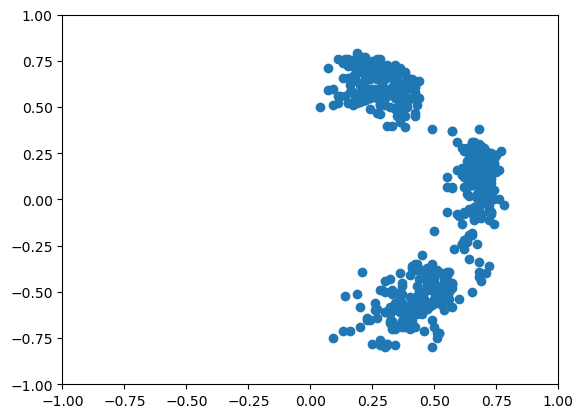

In [70]:
plt.scatter(ggg[' tip_x '], ggg[' tip_y '])
plt.xlim(-1, 1)
plt.ylim(-1, 1)

In [72]:
def plot_all_diss(current_time=None, model='sac', episodes=200, diss_maxtime=20, succ=0, column_num=4):
    plt.figure(figsize=(15,650))
    diss_maxtime_plot=10
    all_tip_pos=[]
    all_diss_data=[]
    order_list=[]
    mol_center_x_nm_before=[]
    mol_center_y_nm_before=[]
    for episode_i in range(episodes):

        plt.subplot(episodes*diss_maxtime_plot,column_num,(succ+1)*column_num+1)
        if os.path.exists('%s/img_forward_%d.png' % (save_img_before, episode_i)):
            
            img=cv2.imread('%s/img_forward_%d.png' % (save_img_before, episode_i), cv2.IMREAD_GRAYSCALE)
            with open('%s/scan_data_%d.pkl' % (save_data_before, episode_i), 'rb') as f:
                scan_data_after = pickle.load(f)
            img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
            img_prop_small.center_points_from_contour(plot_graph=False)
            img_prop_small.contour_property()
            mol_center_x_nm=img_prop_small.ellipse_x
            mol_center_y_nm=img_prop_small.ellipse_y
            order_list.append('%s_0' % episode_i)
            mol_center_x_nm_before.append(mol_center_x_nm)
            mol_center_y_nm_before.append(mol_center_y_nm) 

            plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])


        for diss_i in range(diss_maxtime):
            if os.path.exists('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i)):
                succ+=1
            else:
                continue    

            plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+3)
            img=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after,  episode_i, diss_i), cv2.IMREAD_GRAYSCALE)

            with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos,  episode_i, diss_i), 'rb') as f:
                vet_tip_pos = pickle.load(f)
            with open('%s/scan_data_%d_%d.pkl' % (save_data_after,  episode_i, diss_i), 'rb') as f:
                scan_data_after = pickle.load(f)

            try:
                img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
                img_prop_small.center_points_from_contour(plot_graph=False)
                img_prop_small.contour_property()
                plt.scatter(vet_tip_pos[1], vet_tip_pos[2], c='b', s=10)
                plt.gca().add_patch(patches.Circle((vet_tip_pos[1], vet_tip_pos[2]), diss_radius_nm, color='b', fill=False))
                plt.scatter(vet_tip_pos[3], vet_tip_pos[4], c='r', s=10)
                all_tip_pos.append(vet_tip_pos)

                plt.title('after_%d_%d_%.2f_%.2f' % (episode_i, diss_i, scan_data_after.offset_nm[0], img_prop_small.area))
            except:
                all_tip_pos.append(vet_tip_pos)  ##### should add it
                pass
            plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])
        
            if not os.path.exists('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i)) and os.path.exists('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i+1)):

                mol_center_x_nm=img_prop_small.ellipse_x
                mol_center_y_nm=img_prop_small.ellipse_y
                order_list.append('%s_%s' % (episode_i, diss_i+1))
                mol_center_x_nm_before.append(mol_center_x_nm)
                mol_center_y_nm_before.append(mol_center_y_nm) 
            else:
                pass



            # display adjusted images after dissocation
            plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+4)
            if os.path.exists('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i)):
                
                img=cv2.imread('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i), cv2.IMREAD_GRAYSCALE)

                with open('%s/scan_data_%d_%d_adjust.pkl' % (save_data_after,  episode_i, diss_i), 'rb') as f:
                    scan_data_after = pickle.load(f)


                if os.path.exists('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i+1)):
                    with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos,  episode_i, diss_i+1), 'rb') as f:
                        vert_tip_pos = pickle.load(f)
                    plt.scatter(vert_tip_pos[3], vert_tip_pos[4], c='r', s=10)

                try:
                    img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
                    img_prop_small.center_points_from_contour(plot_graph=False)
                    img_prop_small.contour_property() 
                    plt.title('after_adjust_%d_%d_%.2f_%.2f' % (episode_i, diss_i, scan_data_after.offset_nm[0], img_prop_small.area))
                    if os.path.exists('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i+1)):
                        mol_center_x_nm=img_prop_small.ellipse_x
                        mol_center_y_nm=img_prop_small.ellipse_y
                        order_list.append('%s_%s' % (episode_i, diss_i+1))
                        mol_center_x_nm_before.append(mol_center_x_nm)
                        mol_center_y_nm_before.append(mol_center_y_nm)       
                except:
                    pass
                plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])
      

            # Display dissciation curves
            plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+2)
            if os.path.exists('%s/vert_data_%d_%d.pkl' % (save_vert_data, episode_i, diss_i)):
                with open('%s/vert_data_%d_%d.pkl' % (save_vert_data, episode_i, diss_i), 'rb') as f:
                    vert_data = pickle.load(f)
                with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i), 'rb') as f:
                    vert_tip_pos = pickle.load(f)
                if vert_tip_pos[7]:
                    plt.plot(vert_data.V, vert_data.topography, c='r')
                else:
                    plt.plot(vert_data.V, vert_data.topography)
                all_diss_data.append(vert_data)
                topography=np.array(vert_data.topography)
                diff_topography=np.abs(topography[0:512].sum()-topography[512:].sum())
                plt.title('%d_%d_%.2f_%.2f_%.2f_%s' % (episode_i, diss_i, diff_topography, vert_tip_pos[5], vert_tip_pos[6], vert_tip_pos[7]))
                
    plt.subplots_adjust(wspace=0.5, hspace=0.9)

    # plt.savefig('all_output/vertmani_%s_%s.png' % (model, current_time))

    all_tip_pos_data_diss=pd.DataFrame(all_tip_pos, columns=['label', 'mol_center_x_nm', 'mol_center_y_nm', 'diss_x_nm', 'diss_y_nm', 'diss_mvoltage', 'diss_pcurrent', 'done_diss', 'action'])
    all_tip_pos_data_diss['relative_diss_x']=all_tip_pos_data_diss['diss_x_nm']-all_tip_pos_data_diss['mol_center_x_nm']
    all_tip_pos_data_diss['relative_diss_y']=all_tip_pos_data_diss['diss_y_nm']-all_tip_pos_data_diss['mol_center_y_nm']

    all_tip_pos_data_diss['mol_x_before']=mol_center_x_nm_before
    all_tip_pos_data_diss['mol_y_before']=mol_center_y_nm_before
    all_tip_pos_data_diss['order_list']=order_list
    all_tip_pos_data_diss['relative_diss_x_before']=all_tip_pos_data_diss['diss_x_nm']-all_tip_pos_data_diss['mol_x_before']
    all_tip_pos_data_diss['relative_diss_y_before']=all_tip_pos_data_diss['diss_y_nm']-all_tip_pos_data_diss['mol_y_before']
    # all_tip_pos_data_diss['diss_data']=all_diss_data
    # all_tip_pos_data_diss.to_pickle('all_output/all_tip_pos_data_diss_%s_%s.pkl' % (model, current_time))

    return all_tip_pos_data_diss


In [16]:
current_time

'6_15_22_10'

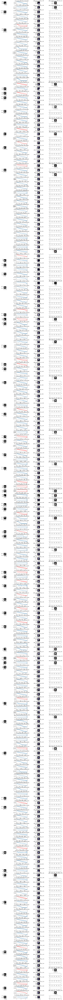

In [20]:
current_time=current_time
model='sac'
episodes=59
diss_maxtime=20
succ=0
column_num=4
plt.figure(figsize=(15,650))
diss_maxtime_plot=10
all_tip_pos=[]
all_diss_data=[]
order_list=[]
mol_center_x_nm_before=[]
mol_center_y_nm_before=[]
for episode_i in range(episodes):

    plt.subplot(episodes*diss_maxtime_plot,column_num,(succ+1)*column_num+1)
    if os.path.exists('%s/img_forward_%d.png' % (save_img_before, episode_i)):
        
        img=cv2.imread('%s/img_forward_%d.png' % (save_img_before, episode_i), cv2.IMREAD_GRAYSCALE)
        with open('%s/scan_data_%d.pkl' % (save_data_before, episode_i), 'rb') as f:
            scan_data_after = pickle.load(f)
        img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
        img_prop_small.center_points_from_contour(plot_graph=False)
        img_prop_small.contour_property()
        mol_center_x_nm=img_prop_small.ellipse_x
        mol_center_y_nm=img_prop_small.ellipse_y
        order_list.append('%s_0' % episode_i)
        mol_center_x_nm_before.append(mol_center_x_nm)
        mol_center_y_nm_before.append(mol_center_y_nm) 

        plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])


    for diss_i in range(diss_maxtime):
        if os.path.exists('%s/img_forward_%d_%d.png' % (save_img_after, episode_i, diss_i)):
            succ+=1
        else:
            continue    

        plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+3)
        img=cv2.imread('%s/img_forward_%d_%d.png' % (save_img_after,  episode_i, diss_i), cv2.IMREAD_GRAYSCALE)

        with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos,  episode_i, diss_i), 'rb') as f:
            vet_tip_pos = pickle.load(f)
        with open('%s/scan_data_%d_%d.pkl' % (save_data_after,  episode_i, diss_i), 'rb') as f:
            scan_data_after = pickle.load(f)

        try:
            img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
            img_prop_small.center_points_from_contour(plot_graph=False)
            img_prop_small.contour_property()
            plt.scatter(vet_tip_pos[1], vet_tip_pos[2], c='b', s=10)
            plt.gca().add_patch(patches.Circle((vet_tip_pos[1], vet_tip_pos[2]), diss_radius_nm, color='b', fill=False))
            plt.scatter(vet_tip_pos[3], vet_tip_pos[4], c='r', s=10)
            all_tip_pos.append(vet_tip_pos)

            plt.title('after_%d_%d_%.2f_%.2f' % (episode_i, diss_i, scan_data_after.offset_nm[0], img_prop_small.area))
        except:
            all_tip_pos.append(vet_tip_pos)  ##### should add it
            pass
        plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])
    
        if not os.path.exists('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i)) and os.path.exists('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i+1)):

            mol_center_x_nm=img_prop_small.ellipse_x
            mol_center_y_nm=img_prop_small.ellipse_y
            order_list.append('%s_%s' % (episode_i, diss_i+1))
            mol_center_x_nm_before.append(mol_center_x_nm)
            mol_center_y_nm_before.append(mol_center_y_nm) 
        else:
            pass



        # display adjusted images after dissocation
        plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+4)
        if os.path.exists('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i)):
            
            img=cv2.imread('%s/img_forward_%d_%d_adjust.png' % (save_img_after,  episode_i, diss_i), cv2.IMREAD_GRAYSCALE)

            with open('%s/scan_data_%d_%d_adjust.pkl' % (save_data_after,  episode_i, diss_i), 'rb') as f:
                scan_data_after = pickle.load(f)


            if os.path.exists('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i+1)):
                with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos,  episode_i, diss_i+1), 'rb') as f:
                    vert_tip_pos = pickle.load(f)
                    
                plt.scatter(vert_tip_pos[3], vert_tip_pos[4], c='r', s=10)

            try:
                img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
                img_prop_small.center_points_from_contour(plot_graph=False)
                img_prop_small.contour_property() 
                plt.title('after_adjust_%d_%d_%.2f_%.2f' % (episode_i, diss_i, scan_data_after.offset_nm[0], img_prop_small.area))
                if os.path.exists('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i+1)):
                    mol_center_x_nm=img_prop_small.ellipse_x
                    mol_center_y_nm=img_prop_small.ellipse_y
                    order_list.append('%s_%s' % (episode_i, diss_i+1))
                    mol_center_x_nm_before.append(mol_center_x_nm)
                    mol_center_y_nm_before.append(mol_center_y_nm)       
            except:

                pass
            plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])
    

        # Display dissciation curves
        plt.subplot(episodes*diss_maxtime_plot,column_num,succ*column_num+2)
        if os.path.exists('%s/vert_data_%d_%d.pkl' % (save_vert_data, episode_i, diss_i)):
            with open('%s/vert_data_%d_%d.pkl' % (save_vert_data, episode_i, diss_i), 'rb') as f:
                vert_data = pickle.load(f)
            with open('%s/vert_tip_pos_%d_%d.pkl' % (save_vert_tip_pos, episode_i, diss_i), 'rb') as f:
                vert_tip_pos = pickle.load(f)
            if vert_tip_pos[7]:
                plt.plot(vert_data.V, vert_data.topography, c='r')
            else:
                plt.plot(vert_data.V, vert_data.topography)
            all_diss_data.append(vert_data)
            topography=np.array(vert_data.topography)
            diff_topography=np.abs(topography[0:512].sum()-topography[512:].sum())
            plt.title('%d_%d_%.2f_%.2f_%.2f_%s' % (episode_i, diss_i, diff_topography, vert_tip_pos[5], vert_tip_pos[6], vert_tip_pos[7]))
            
plt.subplots_adjust(wspace=0.5, hspace=0.9)

# plt.savefig('all_output/vertmani_%s_%s.png' % (model, current_time))

all_tip_pos_data_diss=pd.DataFrame(all_tip_pos, columns=['label', 'mol_center_x_nm', 'mol_center_y_nm', 'diss_x_nm', 'diss_y_nm', 'diss_mvoltage', 'diss_pcurrent', 'done_diss', 'action'])
all_tip_pos_data_diss['relative_diss_x']=all_tip_pos_data_diss['diss_x_nm']-all_tip_pos_data_diss['mol_center_x_nm']
all_tip_pos_data_diss['relative_diss_y']=all_tip_pos_data_diss['diss_y_nm']-all_tip_pos_data_diss['mol_center_y_nm']

# all_tip_pos_data_diss['mol_x_before']=mol_center_x_nm_before
# all_tip_pos_data_diss['mol_y_before']=mol_center_y_nm_before
# all_tip_pos_data_diss['order_list']=order_list
# all_tip_pos_data_diss['relative_diss_x_before']=all_tip_pos_data_diss['diss_x_nm']-all_tip_pos_data_diss['mol_x_before']
# all_tip_pos_data_diss['relative_diss_y_before']=all_tip_pos_data_diss['diss_y_nm']-all_tip_pos_data_diss['mol_y_before']

In [ ]:
all_tip_pos_data_diss

,label,mol_center_x_nm,mol_center_y_nm,diss_x_nm,diss_y_nm,diss_mvoltage,diss_pcurrent,done_diss,action,relative_diss_x,relative_diss_y


In [ ]:
all_tip_pos_data_diss=pd.DataFrame(all_tip_pos, columns=['label', 'mol_center_x_nm', 'mol_center_y_nm', 'diss_x_nm', 'diss_y_nm', 'diss_mvoltage', 'diss_pcurrent', 'done_diss', 'action'])

In [163]:
[i for i in order_list if i not in all_tip_pos_data_diss['label'].tolist()]

[]

In [164]:
len(order_list)

371

In [165]:
len(all_tip_pos_data_diss)

371

In [ ]:
data3=pd.concat([data_all_diss_2, data_all_diss_4], ignore_index = True)

In [ ]:

data_all_diss=data3

In [ ]:
# data_all_diss_4[data_all_diss_4['done_diss']==True]

In [ ]:
current_time

In [80]:



data_all_diss_4=plot_all_diss(current_time=current_time, model='sac', episodes=200)